# Initial Settings

In [ ]:
import torch
import torch.nn as nn
import torchvision
import os
import json
import numpy as np
import cv2
import random
import math

In [ ]:
if torch.cuda.is_available():
    print("Gpu is available!...")
else:
    print("Cpu is available!...")

Cpu is available!...


In [ ]:
# for device agnostic code
device = "gpu" if torch.cuda.is_available() else "cpu"
print(f"Device is : {device}")

Device is : cpu


In [ ]:
#SILINECEK, GECICI
batch_size=3

In [ ]:
def reset_seed(number:int):
    """
    Reset random seed by spesified number

    Args:
        -number: A seed number to use
    """
    random.seed(number)
    torch.manual_seed(number) # manually seed for all devices (cpu, gpu), for torch functionality

    return

# Data Utilities


*   get Dataset by `get_pascal_voc2007_data`
*   get Loader by `get_pascal_voc2007_loader`
*   and other things...




In [ ]:
class_to_idx = {'aeroplane':0, 'bicycle':1, 'bird':2, 'boat':3, 'bottle':4,
                'bus':5, 'car':6, 'cat':7, 'chair':8, 'cow':9, 'diningtable':10,
                'dog':11, 'horse':12, 'motorbike':13, 'person':14, 'pottedplant':15,
                'sheep':16, 'sofa':17, 'train':18, 'tvmonitor':19
}
idx_to_class = {i:c for c, i in class_to_idx.items()}

In [ ]:
def get_pascal_voc2007_data(image_root:str, split:str="train")->torchvision.datasets.VOCDetection:
    """
    Use torchvision.datasets.VOCDetection and returns
    https://pytorch.org/docs/stable/torchvision/datasets.html#torchvision.datasets.VOCDetection
    """
    download = not os.path.isdir(image_root)

    if download == True:
        print(f"directory does not exist, data will be downloaded and loaded into \"{image_root}\" ...")
    else:
        print(f"directory already exist so no downlading needed...")

    train_dataset = torchvision.datasets.VOCDetection(image_root, year="2007", image_set=split, download=download)


    return train_dataset


In [ ]:
def voc_collate_fn(batch_lst, reshape_size=224):
    """
    Args and return statements on this function docstring are not tested yet, so there might be wrong declarations on this docstring !!!

    Args:
        batch_list ( list[tuple(PIL.Image.Image, dict)] ): list object that contains images and annotations as tuples. Len() of this tuple
                                                           will be batch size defined in dataloader object
        reshape_size (int): images will be resized by this value

    Returns:
        img_batch (tensor): preprocessed image batch, shape: (B, 3, reshape_size, reshape_size)
        box_batch (tensor): converted from annotations, shape: (B, MAX_NUM_BOX, 5), 5: (xtl, ytl, xbr, ybr, label)
        w_batch (tensor): image width's before preprocessing: (B, 1)
        h_batch (tensor): image height's befor preprocessing: (B, 1)
        image_id_list (list[str]): image file name: (B)
    """
    preprocess = torchvision.transforms.Compose([
        torchvision.transforms.Resize((reshape_size, reshape_size)),
        torchvision.transforms.ToTensor(),
        torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  #IMAGENET_1K
    ])

    batch_size = len(batch_lst)

    img_batch = torch.zeros(batch_size, 3, reshape_size, reshape_size)

    max_num_box = max([len(batch_lst[i][1]["annotation"]["object"]) \
                          for i in range(batch_size)]
                          )

    box_batch = torch.Tensor(batch_size, max_num_box, 5).fill_(-1)

    w_list = []
    h_list = []
    image_id_list = []

    for i in range(batch_size):
        img, ann = batch_lst[i]
        w_list.append(img.size[0])
        h_list.append(img.size[1])
        image_id_list.append(ann["annotation"]["filename"])
        img_batch[i] = preprocess(img)
        all_boxes = ann["annotation"]["object"]  # list

        assert type(all_boxes) == list, "ann[\"annotation\"][\"object\"] must be list !!!!"
        #
        #if type(all_boxes) == dict:
        #    all_boxes = [all_boxes]
        #

        for box_index, box in enumerate(all_boxes):
            bnd_box = box["bndbox"]
            box_batch[i, box_index] = torch.Tensor([float(bnd_box["xmin"]), float(bnd_box["ymin"]), float(bnd_box["xmax"]),
                                                   float(bnd_box["ymax"]), class_to_idx[box["name"]]])



    w_batch = torch.tensor(w_list)
    h_batch = torch.tensor(h_list)

    return img_batch, box_batch, w_batch, h_batch, image_id_list


In [ ]:
def get_pascal_voc2007_loader(dataset:torchvision.datasets.VOCDetection, batch_size:int, num_workers:int=0)->torch.utils.data.DataLoader:
    """
    Data loader for Pascal VOC 2007
    https://pytorch.org/docs/stable/data.html#torch.utils.data.DataLoader
    """
    loader = torch.utils.data.DataLoader(dataset,
                                batch_size=batch_size,
                                shuffle=False,
                                pin_memory=True,
                                num_workers=num_workers,
                                collate_fn=voc_collate_fn)
    return loader


In [ ]:
def coord_trans(bbox, w_img, h_img, w_amap=7, h_amap=7, mode="a2i"):
    """
    Via specified mode function will project one coordinate system to another.
    For example if mode is "a2i", function project activation map coordinate system to
    ORIGINAL image (not preprocessed) coordinate system and vice versa.

    Args:
        -bbox (tensor): Could be either bbox, anchor or proposal, of shape Bx*x4  (Bx*x5 also applicable
                        we just use first 4 point in that dimension), *: number of box!
        -w_img (tensor): Width (pixels) of ORIGINAL image (not preprocessed), of shape B
        -h_img (tensor): Height (pixels) of ORIGINAL image (not preprocessed), of shape B
        -w_amap (int): Width (pixels) of activation map, scaler
        -h_amap (int): Height (pixels) of activation map, scaler
        -mode (str): Whether transfer from the ORIGINAL image to activation map ("i2a") or the
                     opposite ("a2i")
    Returns:
        -resized_bbox (tensor): Resized (projected to another coord system) box coordinates,
                                of the same shape as the input bbox
    """
    assert mode in ("a2i", "i2a"), "invalid coordinate transformation mode!"
    assert bbox.shape[-1] >= 4, "the transformation is applied to the first 4 values of dim -1"

    if bbox.shape[0] == 0: # corner cases
      return bbox

    resized_bbox = bbox.clone().to(torch.float)
    # could still work if the first dim of bbox is not batch size
    # in that case, w_pixel and h_pixel will be scalers
    resized_bbox = resized_bbox.reshape(bbox.shape[0], -1, bbox.shape[-1])
    invalid_bbox_mask = (resized_bbox == -1) #indicating invalid bbox

    # In some cases w_img or h_img tensors will be 0-dim tensor, for subsequent operations (slice)
    # work properly we need to add singleton dim.
    if w_img.ndim == 0:
        w_img.unsqueeze_(0)
    if h_img.ndim == 0:
        h_img.unsqueeze_(0)



    if mode == "i2a":
        # image to activation
        resized_bbox[:, :, [0, 2]] *= ( w_amap * 1. / w_img[:] ).view(-1, 1, 1)
        resized_bbox[:, :, [1, 3]] *= ( h_amap * 1. / h_img[:] ).view(-1, 1, 1)
    else:
        # activation to image
        resized_bbox[:, :, [0, 2]] /= ( w_amap * 1. / w_img[:] ).view(-1, 1, 1)
        resized_bbox[:, :, [1, 3]] /= ( h_amap * 1. / h_img[:] ).view(-1, 1, 1)


    resized_bbox.masked_fill_(invalid_bbox_mask, -1) # true valued indices will again filled with -1 after resizing operation
    resized_bbox.resize_as_(bbox)
    return resized_bbox


Note: Except visualization, we will do all of our computation on activation coordinate system

# Visualization Utilities

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams["figure.figsize"] = (10.0, 8.0)
plt.rcParams["font.size"] = 16
plt.rcParams["image.interpolation"] = "nearest"
plt.rcParams["image.cmap"] = "gray"

# Model Building

In [ ]:
!pip install torchinfo

In [ ]:
import torchsummary
import torchinfo
from torchvision.models import mobilenet_v2, MobileNet_V2_Weights

class FeatureExtractor(nn.Module):
    """
    This model will be used as an feature extraction (for getting intermediate variable/representation)
    Outputs feature tensor/variable that extracted trough network
    """
    def __init__(self, reshape_size=224, pooling=False, verbose=False):
        """
        args:
            -reshape_size(int): input resolution/shape
            -pooling(bool): if true FeatureExtractor outputs flatten feature, if false outputs unflatten feature tensor
            -verbose(bool): if true prints summary of model/network, otherwise nothing will be printed
        """
        super(FeatureExtractor, self).__init__()

        assert MobileNet_V2_Weights.IMAGENET1K_V2 == MobileNet_V2_Weights.DEFAULT, "IMAGENET1K_V2 is not default as you expected!!"

        self.weights_pre = MobileNet_V2_Weights.DEFAULT  # MobileNet_V2_Weights.IMAGENET1K_V2
        self.mobilenet = mobilenet_v2(weights= self.weights_pre) # parameters are default req_grad=False, we'll handle this below
        self.mobilenet = nn.Sequential(*list(self.mobilenet.children())[:-1])

        #self.mobilenet = torchvision.models.mobilenet_v2(pretrained=True) # Deprecated way
        #self.mobilenet = nn.Sequential(*list(self.mobilenet.children())[:-1])

        if pooling:
            self.mobilenet.add_module("LastAvgPool", nn.AvgPool2d(math.ceil(reshape_size/32.0))) # input: N x 1280 x 7 x 7

        for param in self.mobilenet.parameters():
            param.requires_grad = True # fine tune all parameters

        self.mobilenet.to(device)

        if verbose:
            print(self.mobilenet)   # plain print
            #print(self)  # plain print, this also works (bcf class inherits module)
            torchsummary.summary(self.mobilenet, (3, reshape_size, reshape_size))    # torchsummary



    def forward(self, img, verbose=False):
        """
        args:
            -img(tensor): batch of resized images, of shape Bx3x224x224
            -verbose(bool): if true prints result shape, otherwise not

        returns:
            -features: image feature, of shape Nx1280 (pooled) or Bx1280x7x7
        """
        num_img = img.shape[0]

        img_prepro = img  # we already defined preprocessing on dataloader, return of dataloader will be used here
                          # so do not need to apply preprocessing here

        features = []
        process_batch = 500
        for b in range(math.ceil(num_img/process_batch)):
            features.append(self.mobilenet(img_prepro[b*process_batch:(b+1)*process_batch]
                                           ).squeeze(-1).squeeze(-1))
        features = torch.cat(features)

        if verbose:
            print("Output feature tensor shape: ", features.shape)

        return features



In [ ]:
model = FeatureExtractor(verbose=True)

Downloading: "https://download.pytorch.org/models/mobilenet_v2-7ebf99e0.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-7ebf99e0.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 63.5MB/s]


Sequential(
  (0): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU6(inplace=True)
    )
    (1): InvertedResidual(
      (conv): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
          (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU6(inplace=True)
        )
        (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
    (2): InvertedResidual(
      (conv): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 96, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(96, eps=1e-05, m

In [ ]:
torchinfo.summary(model, (batch_size, 3, 224, 224), depth=7, mode="eval", col_names=("input_size",
                                                                                     "output_size",
                                                                                     "num_params",
                                                                                     "params_percent",
                                                                                     "mult_adds",
                                                                                     "trainable", ), col_width=20)   # torchinfo

Layer (type:depth-idx)                                  Input Shape          Output Shape         Param #              Param %              Mult-Adds            Trainable
FeatureExtractor                                        [3, 3, 224, 224]     [3, 1280, 7, 7]      --                        --              --                   True
├─Sequential: 1-1                                       [3, 3, 224, 224]     [3, 1280, 7, 7]      --                        --              --                   True
│    └─Sequential: 2-1                                  [3, 3, 224, 224]     [3, 1280, 7, 7]      --                        --              --                   True
│    │    └─Conv2dNormActivation: 3-1                   [3, 3, 224, 224]     [3, 32, 112, 112]    --                        --              --                   True
│    │    │    └─Conv2d: 4-1                            [3, 3, 224, 224]     [3, 32, 112, 112]    864                    0.04%              32,514,048           True

# Workspace

### Getting Datasets and Dataloaders

In [ ]:
train_dataset = get_pascal_voc2007_data("./data", "train")
val_dataset = get_pascal_voc2007_data("./data", "val")

directory does not exist, data will be downloaded and loaded into "./data" ...


100%|██████████| 460032000/460032000 [00:41<00:00, 11120161.06it/s]


Extracting ./data/VOCtrainval_06-Nov-2007.tar to ./data
directory already exist so no downlading needed...


In [ ]:
!ls

data  sample_data


In [ ]:
type(train_dataset[0][0]), type(train_dataset[0][1])

(PIL.Image.Image, dict)

In [ ]:
print(json.dumps(train_dataset[1][1], indent=2))

{
  "annotation": {
    "folder": "VOC2007",
    "filename": "000017.jpg",
    "source": {
      "database": "The VOC2007 Database",
      "annotation": "PASCAL VOC2007",
      "image": "flickr",
      "flickrid": "228217974"
    },
    "owner": {
      "flickrid": "genewolf",
      "name": "whiskey kitten"
    },
    "size": {
      "width": "480",
      "height": "364",
      "depth": "3"
    },
    "segmented": "0",
    "object": [
      {
        "name": "person",
        "pose": "Left",
        "truncated": "0",
        "difficult": "0",
        "bndbox": {
          "xmin": "185",
          "ymin": "62",
          "xmax": "279",
          "ymax": "199"
        }
      },
      {
        "name": "horse",
        "pose": "Left",
        "truncated": "0",
        "difficult": "0",
        "bndbox": {
          "xmin": "90",
          "ymin": "78",
          "xmax": "403",
          "ymax": "336"
        }
      }
    ]
  }
}


In [ ]:
import multiprocessing
num_workers = multiprocessing.cpu_count()
print(f"number of workers (cpu): {num_workers}")

number of workers (cpu): 2


In [ ]:
train_dataset = torch.utils.data.Subset(train_dataset, torch.arange(0, 2500)) # use 2500 samples for training

train_loader = get_pascal_voc2007_loader(train_dataset, 10, num_workers=num_workers)
val_loader = get_pascal_voc2007_loader(val_dataset, 10, num_workers=num_workers)


In [ ]:
print(f"*"*20)
print(f"train dataset size: {2501}")  #
print(f"train sub dataset size: {len(train_dataset)}")
print(f"*"*20)
print(f"val dataset size:{len(val_dataset)}")


********************
train dataset size: 2501
train sub dataset size: 2500
********************
val dataset size:2510


In [ ]:
len(train_loader), len(val_loader)  # number of mini batch (batch size is 10)

(250, 251)

In [ ]:
train_loader_iter = iter(train_loader)
img, ann, _, _, _ = next(train_loader_iter)

print("img shape: ", img.shape)
print("ann shape: ", ann.shape)

print('Image 1 has only two annotated objects, so ann[1] is padded with -1:')
print(ann[1])

print('\nImage 2 has six annotated objects:, so ann[2] is not padded:')
print(ann[2])

print('\nEach row in the annotation tensor indicates (x_tl, y_tl, x_br, y_br, class).')

img shape:  torch.Size([10, 3, 224, 224])
ann shape:  torch.Size([10, 6, 5])
Image 1 has only two annotated objects, so ann[1] is padded with -1:
tensor([[185.,  62., 279., 199.,  14.],
        [ 90.,  78., 403., 336.,  12.],
        [ -1.,  -1.,  -1.,  -1.,  -1.],
        [ -1.,  -1.,  -1.,  -1.,  -1.],
        [ -1.,  -1.,  -1.,  -1.,  -1.],
        [ -1.,  -1.,  -1.,  -1.,  -1.]])

Image 2 has six annotated objects:, so ann[2] is not padded:
tensor([[  9., 230., 245., 500.,   1.],
        [230., 220., 334., 500.,   1.],
        [  2., 178.,  90., 500.,   1.],
        [  2.,   1., 117., 369.,  14.],
        [  3.,   2., 243., 462.,  14.],
        [225.,   1., 334., 486.,  14.]])

Each row in the annotation tensor indicates (x_tl, y_tl, x_br, y_br, class).


### Visualize Data ( Pascal Voc2007 )

In [ ]:
#reset_seed(31)
#batch_size = 3
#sampled_idx = torch.randperm(len(train_dataset))[:batch_size].to(torch.long)

reset_seed(0)
batch_size = 3  # these 3 image will be our dummy variable that we will try model
sampled_idx = torch.linspace(0, len(train_dataset)-1, steps=batch_size).long()

h_list = []
w_list = []
img_list = []
MAX_NUM_BOX = 40
box_list = torch.Tensor(batch_size, MAX_NUM_BOX, 5).fill_(-1).to(torch.int) #placeholder

for idx, i in enumerate(sampled_idx):
    # we can get image and ann from directly dataset object (so we dont have to load from local)
    img, ann = train_dataset.__getitem__(i) # == [i]
    img_list.append(img)

    all_boxes = ann["annotation"]["object"]
    assert type(all_boxes) == list, "ann[\"annotation\"][\"object\"] must be list !!!!"
    #if type(all_bbox) == dict:
    #all_bbox = [all_bbox]

    for bbox_idx, one_bbox in enumerate(all_boxes):
        bbox = one_bbox["bndbox"]
        obj_class = one_bbox["name"]
        box_list[idx][bbox_idx] = torch.Tensor([int(bbox["xmin"]), int(bbox["ymin"]),
                                                int(bbox["xmax"]), int(bbox["ymax"]), int(class_to_idx[obj_class]) ]).to(torch.long)

    img = np.array(img)
    w_list.append(img.shape[1])
    h_list.append(img.shape[0])

w_list = torch.as_tensor(w_list)
h_list = torch.as_tensor(h_list)
gt_boxes_amap = coord_trans(box_list, w_list, h_list, mode='i2a') # box_list is in image/pixel space, convert it to activation map

In [ ]:
def detection_visualizer(img, idx_to_class, bbox=None, pred=None):
    """
    Visualize ORIGINAL (not preprocessed) image. If you specify boxes
    it will render these ones on image. You can give just gt boxes or proposals
    But also supports to render gt and proposal simultaneously

    Args:
        -img (PIL):                 image that will be visualized (just one image, no batch)
        -idx_to_class (list):       return class name given idx (0-19)
        -bbox (tensor, optional):   GT bbox (in red) a tensor of shape Nx5. N is
                                    the number of gt boxes, 5 indicates (x_tl, y_tl,
                                    x_br, y_br, class_idx)
        -pred (tensor, optional):   predicted bbox (in green), a tensor of shape N'x6. N is
                                    the number of predicted boxes, 6 indicates (x_tl, y_tl,
                                    x_br, y_br, class_idx, object_confidence_score)
    """
    img_copy = np.array(img).astype("uint8")

    if bbox is not None:
        for box_idx in range(bbox.shape[0]):
            one_box = bbox[box_idx][:4]
            one_box = [int(each) for each in one_box]

            cv2.rectangle(img_copy, (one_box[0], one_box[1]), (one_box[2], one_box[3]),
                          (255, 0, 0), 2)

            #cv2.rectangle(img_copy, (one_bbox[0], one_bbox[1]), (one_bbox[2],
            #            one_bbox[3]), (255, 0, 0), 2)


            if bbox.shape[1] > 4:  # if class info provided
                class_name = idx_to_class[bbox[box_idx][4].item()]
                cv2.putText(img=img_copy,
                            text=str(class_name),
                            org=(one_box[0], one_box[1]+15),
                            fontFace=cv2.FONT_HERSHEY_COMPLEX,
                            fontScale=1.0,
                            color=(0, 0,255),
                            thickness=1)

    if pred is not None:
        for box_idx in range(pred.shape[0]):
            one_box = pred[box_idx][:4]
            one_box = [int(each) for each in one_box]
            cv2.rectangle(img=img_copy, pt1=(one_box[0], one_box[1]), pt2=(one_box[2], one_box[3]),
                          color=(0, 255, 0), thickness=2)

            if pred.shape[1] > 4:  # if class and confidence score provided
                class_name = idx_to_class[pred[box_idx][4].item()]
                confidence_score = pred[box_idx][5].item()
                text = class_name + " %.2f" % confidence_score
                cv2.putText(img=img_copy,
                            text=text,
                            org=(one_box[0], one_box[1]+15),
                            fontFace=cv2.FONT_HERSHEY_COMPLEX,
                            fontScale=1.0,
                            color=(0, 0,255),
                            thickness=1)
    plt.imshow(img_copy)
    plt.axis("off")
    plt.show()


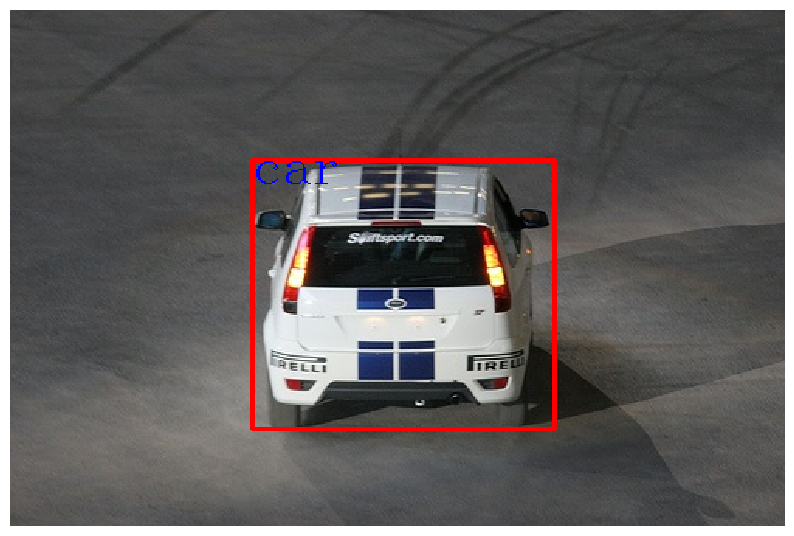

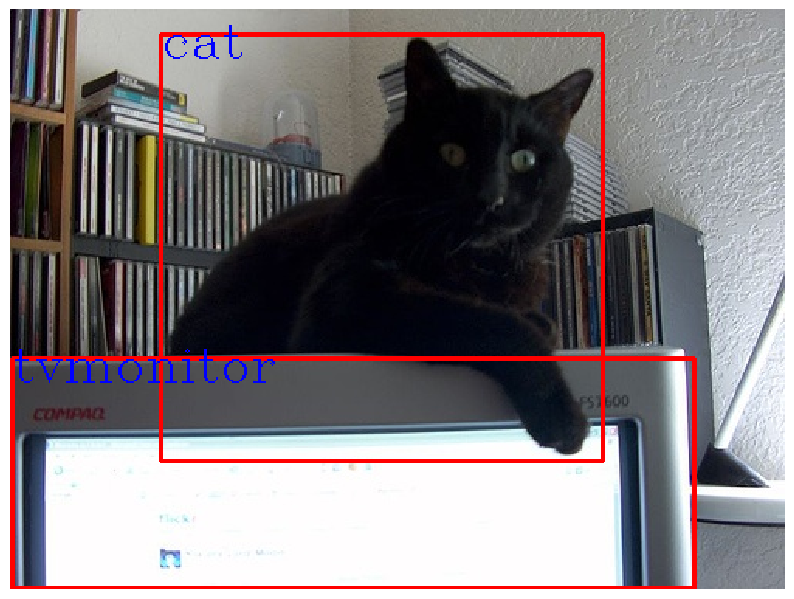

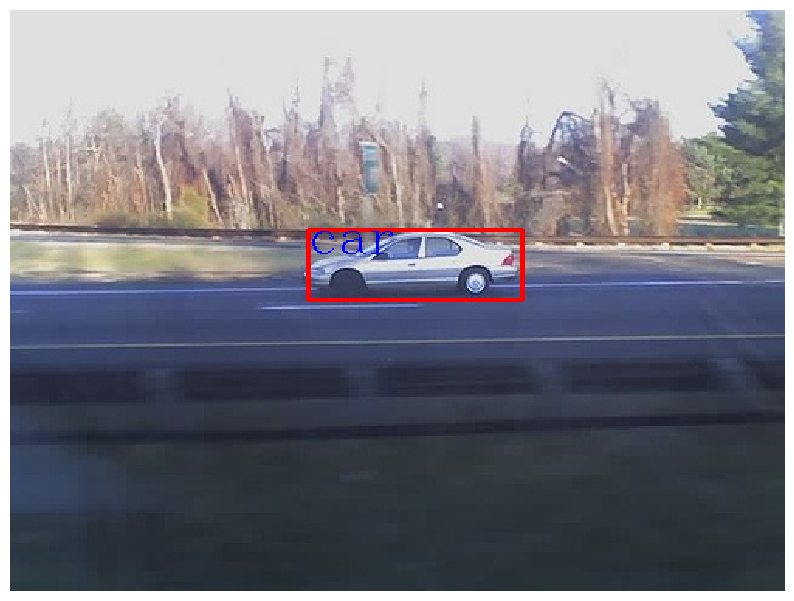

In [ ]:
# visualize GT boxes
for i in range(len(img_list)):
    count_of_valid_box = sum([ 1 if j != -1 else 0 for j in box_list[i][:, 0] ])
    detection_visualizer(img_list[i], idx_to_class, box_list[i][:count_of_valid_box])

### Grid Cell Centers and Grid Cell Corners


In [ ]:
# Anchor Shapes
anchor_list = torch.tensor([[1, 1], [2, 2], [3, 3], [4, 4], [5, 5], [2, 3], [3, 2], [3, 5], [5, 3]]).float().to(device)
print(anchor_list.shape)

torch.Size([9, 2])


In [ ]:
x = torch.rand(7,)
x

tensor([0.4963, 0.7682, 0.0885, 0.1320, 0.3074, 0.6341, 0.4901])

In [ ]:
x.repeat(7,1).shape

torch.Size([7, 7])

In [ ]:
def generateGridCenters(batch_size, w_amap=7, h_amap=7, dtype=torch.float32, device="cpu"):
    """
    Returns a grid cell center coordinates given a batch size on ACTIVATION/FEATURE MAP

    Args:
        -batch_size(int): B
        -w_map(int): width of the activation map W' (number of grids in the horizontal dimension)
        -h_map(int): height of the activation map H' (number of grids in the vertical dimension)
        -dtype(torch.type)
        -device(torch.device)

    Returns:
        -grid_cell_center(tensor): A tensor of shape (B, H', W', 2) giving the x, y coordinates of the centers
               of each feature for a feature map/activation map of shape (B, D, H', W')
    """
    w_range = torch.arange(0, w_amap, dtype=dtype, device=device) + 0.5
    h_range = torch.arange(0, h_amap, dtype=dtype, device=device) + 0.5

    x = w_range.unsqueeze(0).repeat(h_amap, 1)  # convert to row vector and then repeat vector along 0.dim (row axis) at h_map amount
    y = h_range.unsqueeze(1).repeat(1, w_amap)  # convert to column vector and then repeat vector along 1.dim (column axis) at w_map amount
    x_y = torch.stack((x,y), dim=-1)            # do not forget the diffrence between cat and stack!!
    grid_cell_center = x_y.unsqueeze(0).repeat(batch_size, 1, 1, 1)  # after concataneting we need to repeat this tensor along new, batch dim

    return grid_cell_center



def generateGridCorners(grid_cell_center:torch.Tensor, dtype=torch.float32, device="cpu"):
    """
    Returns a grid cell corner coordinates given a batch size on ACTIVATION/FEATURE MAP
    H', W' : height and width of actv/feature map respectively

    Args:
        -batch_size(int): B
        -grid_cell_center(tensor): A tensor of shape (B, H', W', 2) giving the x, y coordinates of the centers
                                   of each feature for a feature map-activation map of shape (B, D, H', W')
        -dtype(torch.type)
        -device(torch.device)

    Returns:
        -grid_cell_corner(tensor): A tensor of shape (B, H', W', 4) giving the x_tl, y_tl, x_br, y_br coordinates of the
                                   each feature for a feature map/activation map of shape (B, D, H', W')
    """
    grid_cell_corner = grid_cell_center.repeat(1, 1, 1, 2)  # -> B, H', W', 4
    grid_cell_corner[... , [0, 1]] -= 1.0 / 2.0  # [..., [0,1]] -> [:, :, :, [0,1]]
    grid_cell_corner[... , [2, 3]] += 1.0 / 2.0

    return grid_cell_corner


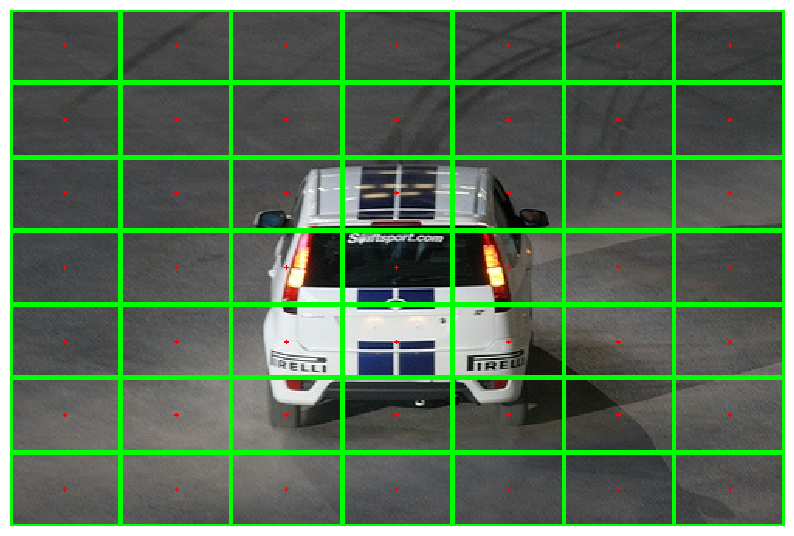

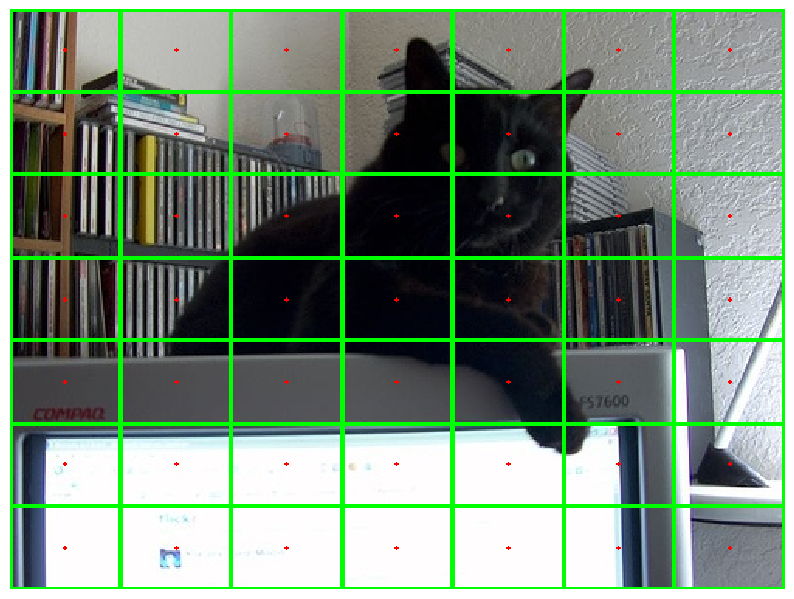

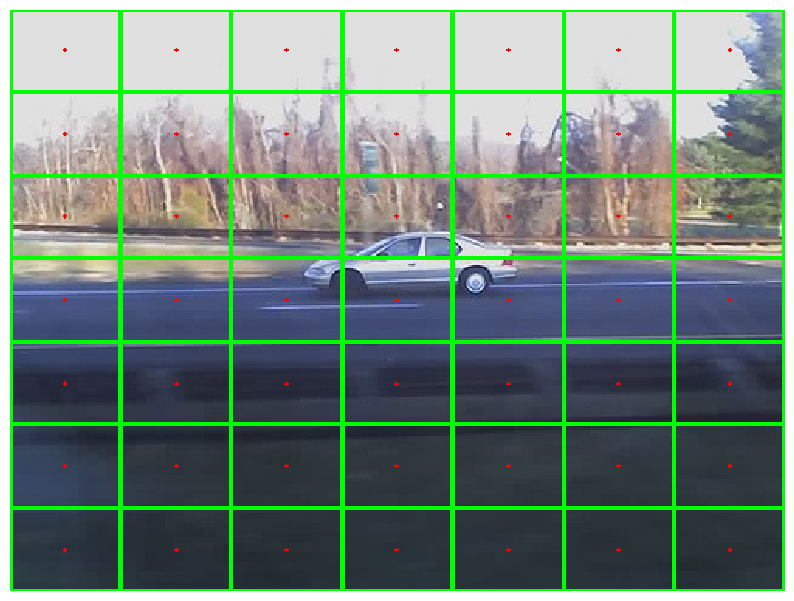

In [ ]:
# visualization
# simply create an activation grid where the cells are in green and the centers in red

grid_cell_centers = generateGridCenters(batch_size = w_list.shape[0])

grid_cell_centers_temp = torch.cat((grid_cell_centers, grid_cell_centers), dim=-1)   # detection visulizer gets corner representational bbox (4-d vectors) (green) and pred (red)
                                                                                     # we want to visualize our center points (2-d vectors) in red color with this function
                                                                                     # because of this reason we'll trick function by repeating center point (2-d vec) to (4-d vec)
                                                                                     # in summary we'll trick detection_visualizer by giving centers as if they are red boxes
                                                                                     # CAUTION: we must not change actual grid_cell_center, for this reason grid_cell_centers_temp is created-used
grid_cell_corners = generateGridCorners(grid_cell_centers)

grid_cell_centers_temp = coord_trans(grid_cell_centers_temp, w_list, h_list)
grid_cell_corners = coord_trans(grid_cell_corners, w_list, h_list)

for img, anc, grid in zip(img_list, grid_cell_centers_temp, grid_cell_corners):
  detection_visualizer(img, idx_to_class, anc.reshape(-1, 4), grid.reshape(-1, 4))

In [ ]:
assert grid_cell_centers.shape[3] == 2, "Center should be one point (x,y)"  #checkpoint

So now we have grid cell centers and corners.

In [ ]:
assert torch.all(grid_cell_centers[0] == grid_cell_centers[1]), "Grid cell centers should be sample (B) independent!... (all sample/batch values should be same)" #checkpoint

### Generate Anchor, Testing and Benchmark
Vectorizational implementation of generateAnchor is 35x faster!

In [ ]:
def generateAnchor(anc_shapes, grid_cell_center, device="cpu"):
    """
    Generates anchors by specified grid cell center coordinates on feature/activation space/map/representation.
    H',W' indicates height and width of activation map

    Args:
        -anc_shapes(tensor): tensor of shape (A, 2) giving the shapes of anchor boxes to consider at
        each point in the grid. anc_shapes[a] = (w, h) gives the width and height of the a'th anchor shape.

        -grid_cell_center(tensor): tensor of shape (B, H', W', 2) giving the (x, y) coordinates of the center
        of each feature/activation from the backbone activation/feature map. This is the tensor returned from
        GenerateGrid.

    Returns:
        -anchors(tensor): tensor of shape (B, A, H', W', 4) giving the positions of all anchor boxes for the
        entire feature/activation map. anchors[b, a, h, w] is an anchor box centered at grid[b, h, w], whose
        shape is given by anc[a]; we parameterize boxes as anchors[b, a, h, w] = (x_tl, y_tl, x_br, y_br), where
        (x_tl, y_tl) and (x_br, y_br) give the xy coordinates of the top-left and bottom-right corners of the box

    """

    anc_shapes = anc_shapes.clone().to(device)
    grid_cell_center = grid_cell_center.clone().to(device)
    A = anc_shapes.shape[0]
    B = grid_cell_center.shape[0]
    grid_center = grid_cell_center[0]

    #print("grid_center.shape: ",grid_center.shape)
    #print("anc_shapes.shape: ", anc_shapes.shape)
    #print("*"*40+"\n")

    # First stage
    grid_center = grid_center.repeat(1, 1, 2 * A)
    assert grid_center.shape[2] == 36
    #print("grid_center repeated shape: ", grid_center.shape)

    # Second stage
    anc_shapes = anc_shapes.repeat(1, 2)
    assert anc_shapes.shape[1] == 4
    #print("anc_shapes repeated shape: ", anc_shapes.shape)

    # Third stage
    anc_shapes = anc_shapes.reshape([1, 36])
    assert anc_shapes.shape == (1, 36)
    #print("anc_shapes flattened: ",anc_shapes.shape)

    # Forth stage (operations)
    anchors = torch.empty(grid_center.shape)
    array_x_y_min_idx = torch.Tensor([ [x_min, y_min] for x_min, y_min in zip(torch.arange(0, 36, 4), torch.arange(1, 36, 4))]).reshape(-1).to(torch.int)
    anchors[:, :, array_x_y_min_idx] = grid_center[:, :, array_x_y_min_idx] - (anc_shapes[:, array_x_y_min_idx] / 2.0)

    array_x_y_max_idx = torch.Tensor([ [x_min, y_min] for x_min, y_min in zip(torch.arange(2, 36, 4), torch.arange(3, 36, 4))]).reshape(-1).to(torch.int)
    anchors[:, :, array_x_y_max_idx] = grid_center[:, :, array_x_y_max_idx] + (anc_shapes[:, array_x_y_max_idx] / 2.0)
    #print("anchors: ",anchors.shape)

    # Fifth stage (batch repeat)
    anchors = anchors.repeat(B, 1, 1, 1)
    #print("anchors repeated for batch: ",anchors.shape)

    # Last stage
    anchors = anchors.reshape(B, 7, 7, A, 4).permute(0, 3, 1, 2, 4)
    #print("anchors reshaped, A dim extracted: ", anchors.shape)

    print("******", anchors.shape)
    return anchors


In [ ]:
#def GenerateAnchor(anc, grid):
#  """
#  Anchor generator.
#
#  Inputs:
#  - anc: Tensor of shape (A, 2) giving the shapes of anchor boxes to consider at
#    each point in the grid. anc[a] = (w, h) gives the width and height of the
#    a'th anchor shape.
#  - grid: Tensor of shape (B, H', W', 2) giving the (x, y) coordinates of the
#    center of each feature from the backbone feature map. This is the tensor
#    returned from GenerateGrid.
#
#  Outputs:
#  - anchors: Tensor of shape (B, A, H', W', 4) giving the positions of all
#    anchor boxes for the entire image. anchors[b, a, h, w] is an anchor box
#    centered at grid[b, h, w], whose shape is given by anc[a]; we parameterize
#    boxes as anchors[b, a, h, w] = (x_tl, y_tl, x_br, y_br), where (x_tl, y_tl)
#    and (x_br, y_br) give the xy coordinates of the top-left and bottom-right
#    corners of the box.
#  """
#  anchors = None
#  ##############################################################################
#  # TODO: Given a set of anchor shapes and a grid cell on the activation map,  #
#  # generate all the anchor coordinates for each image. Support batch input.   #
#  ##############################################################################
#  # Replace "pass" statement with your code
#
#  B,H,W,_ = grid.shape
#  A = anc.shape[0]
#  anchors = torch.zeros(B,A,H,W,4,device = 'cpu')
#  for b in range(B):
#    for a in range(A):
#      for h in range(H):
#        for w in range(W):
#          x_tl = grid[b,h,w,0] - anc[a,0]/2
#          y_tl = grid[b,h,w,1] - anc[a,1]/2
#          x_br = grid[b,h,w,0] + anc[a,0]/2
#          y_br = grid[b,h,w,1] + anc[a,1]/2
#          anchors[b,a,h,w,:] = torch.Tensor([x_tl,y_tl,x_br,y_br])
#  ##############################################################################
#  #                               END OF YOUR CODE                             #
#  ##############################################################################
#
#  return anchors

In [ ]:
def rel_error(x, y, eps=1e-10):
    """
    Compute the relative error between a pair of tensors x and y,
    which is defined as:

                            max_i |x_i - y_i]|
    rel_error(x, y) = -------------------------------
                      max_i |x_i| + max_i |y_i| + eps

    Inputs:
    - x, y: Tensors of the same shape
    - eps: Small positive constant for numeric stability

    Returns:
    - rel_error: Scalar giving the relative error between x and y
    """
    """ returns relative error between x and y """
    top = (x - y).abs().max().item()
    bot = (x.abs() + y.abs()).clamp(min=eps).max().item()
    return top / bot

In [ ]:
%%time
# sanity check
anc_list = generateAnchor(anchor_list, grid_cell_centers)
assert anc_list.shape == torch.Size([3, 9, 7, 7, 4]), 'shape mismatch!'

expected_anc_list_mean = torch.tensor([[-1.25000000, -0.87500000,  2.25000000,  1.87500000],
                                       [ 1.75000000, -0.87500000,  5.25000000,  1.87500000],
                                       [ 4.75000000, -0.87500000,  8.25000000,  1.87500000],
                                       [-1.25000000,  1.12500000,  2.25000000,  3.87500000],
                                       [ 1.75000000,  1.12500000,  5.25000000,  3.87500000],
                                       [ 4.75000000,  1.12500000,  8.25000000,  3.87500000],
                                       [-1.25000000,  3.12500000,  2.25000000,  5.87500000],
                                       [ 1.75000000,  3.12500000,  5.25000000,  5.87500000],
                                       [ 4.75000000,  3.12500000,  8.25000000,  5.87500000],
                                       [-1.25000000,  5.12500000,  2.25000000,  7.87500000],
                                       [ 1.75000000,  5.12500000,  5.25000000,  7.87500000],
                                       [ 4.75000000,  5.12500000,  8.25000000,  7.87500000]], dtype=torch.float32, device='cpu')
print('rel error: ', rel_error(expected_anc_list_mean, anc_list[0, [1,3,6,8], ::2, ::3, :].view(-1, 12, 4).mean(0)))


****** torch.Size([3, 9, 7, 7, 4])
rel error:  0.0
CPU times: user 4.27 ms, sys: 0 ns, total: 4.27 ms
Wall time: 8.78 ms


In [ ]:
311/9

34.55555555555556

In [ ]:
grid_cell_centers.shape

torch.Size([3, 7, 7, 2])

### Anchor Visualization

********************************************************************************
All nine anchors should be exactly centered:
****** torch.Size([3, 9, 7, 7, 4])
torch.Size([9, 1, 1, 4])


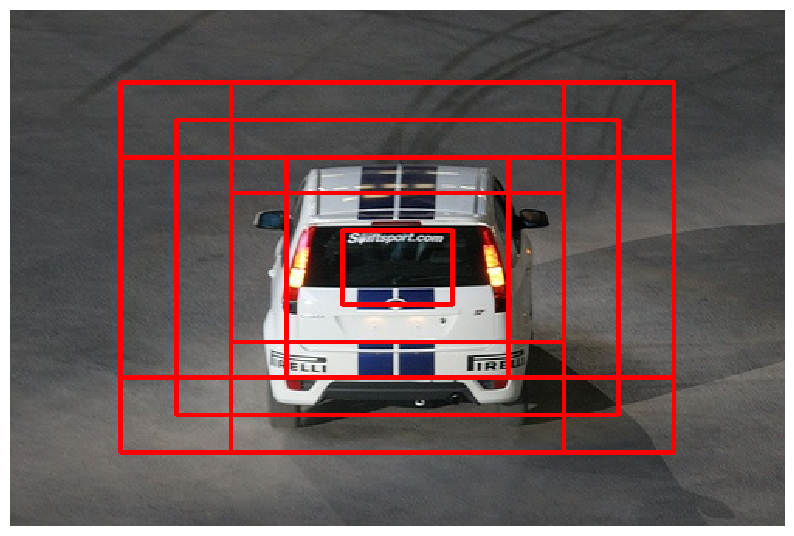

torch.Size([9, 1, 1, 4])


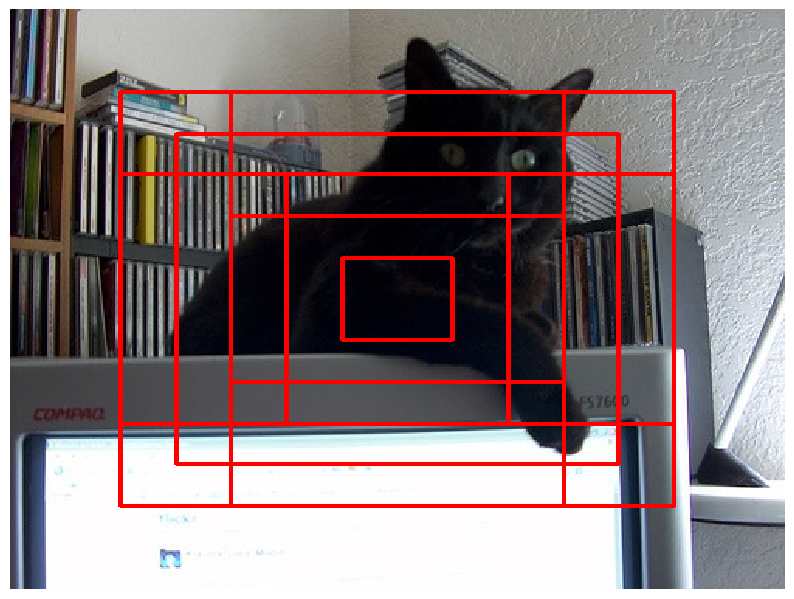

torch.Size([9, 1, 1, 4])


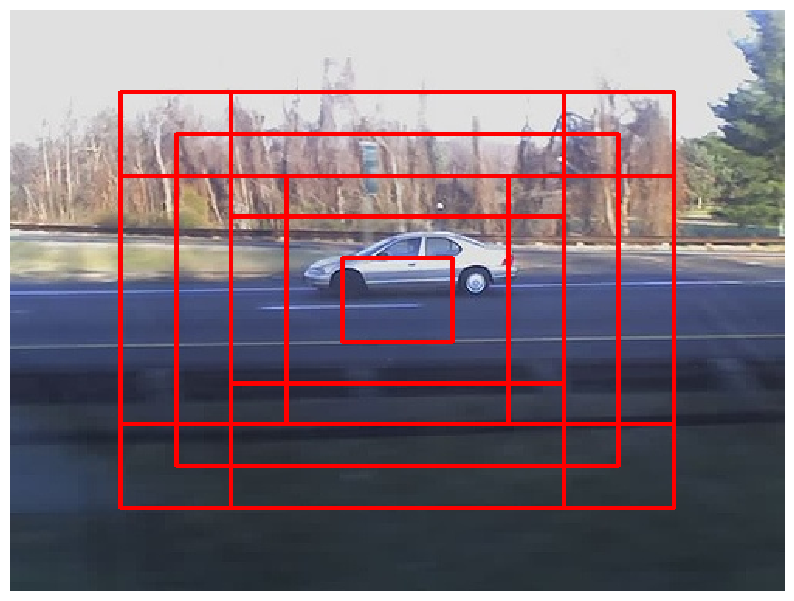

********************************************************************************
All anchors of the image (cluttered):
****** torch.Size([3, 9, 7, 7, 4])
torch.Size([9, 7, 7, 4])


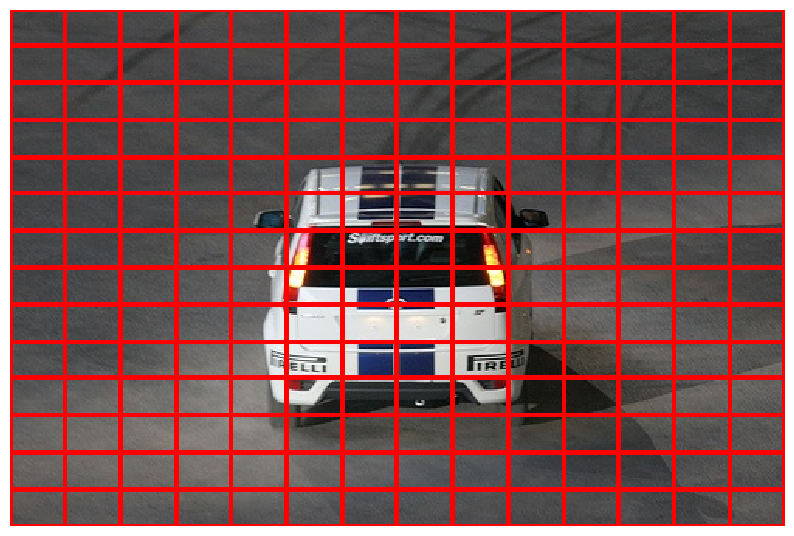

torch.Size([9, 7, 7, 4])


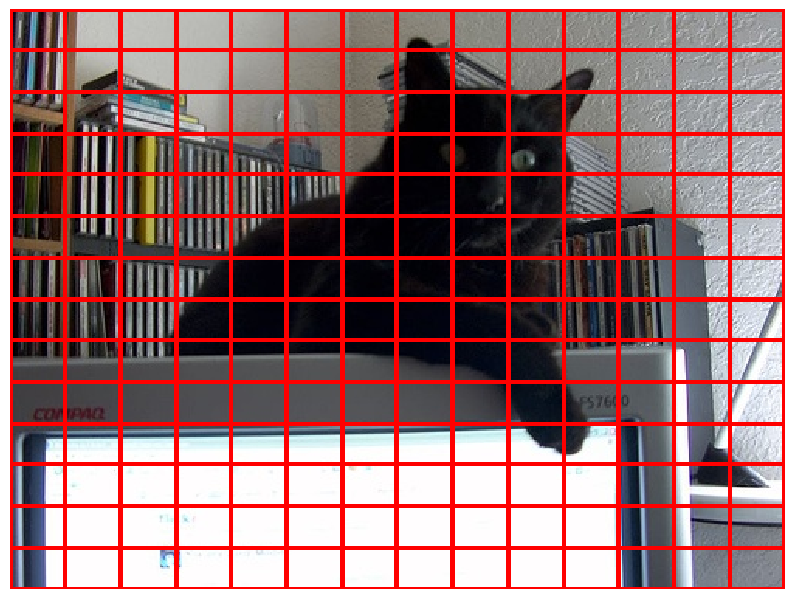

torch.Size([9, 7, 7, 4])


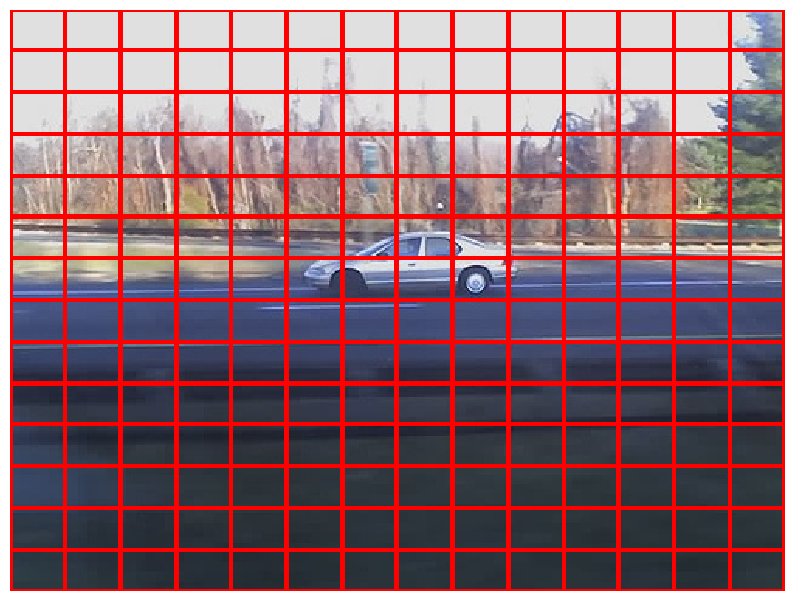

In [ ]:
# visualization
print('*'*80)
print('All nine anchors should be exactly centered:')
anc_list = generateAnchor(anchor_list, grid_cell_centers)[:, :, 3:4, 3:4]
for img, anc in zip(img_list, coord_trans(anc_list, w_list, h_list)):
  print(anc.shape)
  detection_visualizer(img, idx_to_class, anc.reshape(-1, 4))

print('*'*80)
print('All anchors of the image (cluttered):')
anc_list = generateAnchor(anchor_list, grid_cell_centers) # all
for img, anc in zip(img_list, coord_trans(anc_list, w_list, h_list)):
  print(anc.shape)
  detection_visualizer(img, idx_to_class, anc.reshape(-1, 4))

### Proposal Generation, Testing and Benchmark

In [ ]:
def changeRepresentation(box:torch.Tensor ,mode:str="corner2center"):
    """
    Change representation of box one to another. If "corner2center"
    BE CAREFUL!: there is no mechanism inside of this function to check your
    box representation before operations! So be sure about your representation
    and then call this function!

    Args:
        -box(tensor): of shape (B, A, H', W', 4).
        -mode(str): if "corner2center" this will change your (xl, y_tl, x_br,
        y_br) to (x, y, w, h) and for "center2corner" will just do the opposite

    Returns:
        -box(tensor): of shape (B, A, H', W', 4)

    """
    assert mode == "corner2center" or mode == "center2corner", "Invalid string for mode arg"
    B, A, H, W, _ = box.shape

    box = box.clone()
    box = box.permute(0, 2, 3, 1, 4).reshape(B, H, W, A * 4)



    if mode == "corner2center":
        width = box[:, :, :, torch.arange(2, A*4, 4)] - box[:, :, :, torch.arange(0, A*4, 4)]             # -> (B, H, W, 9) width value for every box
        height = box[:, :, :, torch.arange(3, A*4, 4)] - box[:, :, :, torch.arange(1, A*4, 4)]            # -> (B, H, W, 9) height value for every box



        box[:, :, :, torch.arange(0, A*4, 4)]  = box[:, :, :, torch.arange(0, A*4, 4)]  + width / 2.0     # x_tl -> x_c
        box[:, :, :, torch.arange(1, A*4, 4)]  = box[:, :, :, torch.arange(1, A*4, 4)]  + height / 2.0    # y_tl -> y_c

        box[:, :, :, torch.arange(2, A*4, 4)] = width       # x_br -> w
        box[:, :, :, torch.arange(3, A*4, 4)] = height      # y_br -> h

    elif mode == "center2corner":

        box[:, : ,:, torch.arange(0, A*4, 4)] = box[:, : ,:, torch.arange(0, A*4, 4)] - box[:, : ,:, torch.arange(2, A*4, 4)] / 2.0     # x_c -> x_tl
        box[:, : ,:, torch.arange(1, A*4, 4)] = box[:, : ,:, torch.arange(1, A*4, 4)] - box[:, : ,:, torch.arange(3, A*4, 4)] / 2.0     # y_c -> y_tl
        box[:, : ,:, torch.arange(2, A*4, 4)] = box[:, : ,:, torch.arange(0, A*4, 4)] + box[:, : ,:, torch.arange(2, A*4, 4)]           # w (actually it is x_tl right now)-> x_br
        box[:, : ,:, torch.arange(3, A*4, 4)] = box[:, : ,:, torch.arange(1, A*4, 4)] + box[:, : ,:, torch.arange(3, A*4, 4)]           # h (actually it is y_tl right now)-> y_br


    #re reshaping
    box = box.reshape(B, H, W, A, 4).permute(0, 3, 1, 2, 4)

    return box

**YOLO**

For YOLO, we assume that $t^x$ and $t^y$ are both in the range $-0.5 \leq t^x, t^y \leq 0.5$, while $t^w$ and $t^h$ are real numbers in the range $(-\infty, \infty)$. Then we have:
- $x_c^p=x_c^a+t^x$
- $y_c^p=y_c^a+t^y$
- $w^p=w_a \exp \left(t^w\right)$
- $h^p=h_a \exp \left(t^h\right)$

**Faster R-CNN**

For Faster R-CNN, we assume that all transformation parameters $t^x, t^y, t^w, t_h$ are real numbers in the range $(-\infty, \infty)$. Then we have:
- $x_c^p=x_c^a+t^x w^a$
- $y_c^p=y_c^a+t^y h^a$
- $w^p=w_a \exp \left(t^w\right)$
- $h^p=h_a \exp \left(t^h\right)$

In [ ]:
def generateProposal(anchors, transformations, method="YOLO"):
    """
    Generates proposals after applying transformation on anchors.(Anchors should
    be "midpoint"/"center" representation (x,y,w,h) to calculate proposals. Change
    representation by "changeRepresentation()" if necessary.

    Args:
        -anchors(tensor): of shape (B, A, H', W', 4). Should be in center
        representation rather than midpoint.
        -transformation(tensor): Transformations of shape (B, A, H', W', 4)
        that will be used to convert anchor boxes into region proposals. The
        transformations[b, a, h, w] = (tx, ty, tw, th) will be applied to
        the anchors[b, a, h, w]. For YOLO, assume that tx and ty are in
        the range (-0.5, 0.5). For Faster RCNN there is no restrict.
        -method(str): Which transformation formula to use, either "YOLO" or
        "FasterRCNN".

    Returns:
        -proposals(tensor): Region proposals of shape (B, A, H', W', 4).
        Applying the transformations[b, a, h, w] to anchors[b, a, h, w]
        should give the proposals[b, a, h, w]. In the end, representation of
        proposals should be "corner"!

    """
    assert method in (["YOLO", "FasterRCNN"])

    #anchors_center = changeRepresentation(anchors.clone(), "corner2center")
    anchors_center = changeRepresentation(anchors, "corner2center")
    proposals_center = anchors_center.clone()

    # proposal w, h calculated
    proposals_center[:, :, :, :, [2,3]] = anchors_center[:, :, :, :, [2,3]] * torch.exp(transformations[:, :, :, :, [2,3]])

    if method == "YOLO":
        # tx, ty transformations for YOLO should be clamped (-0.5, 0.5)
        transformations[:, :, :, :, [0,1]] = transformations[:, :, :, :, [0,1]].clamp(min=-0.5, max=0.5)
        # tx, ty transformations applied for YOLO
        proposals_center[:, :, :, :, [0,1]] = anchors_center[:, :, :, :, [0,1]] + transformations[:, :, :, :, [0,1]]

    elif method == "FasterRCNN":
        # tx, ty transformation applied for FasterRCNN
        proposals_center[:, :, :, :, [0,1]] = anchors_center[:, :, :, :, [0,1]] + transformations[:, :, :, :, [0,1]] * anchors_center[:, :, :, :, [2,3]]


    return changeRepresentation(proposals_center, mode="center2corner")




In [ ]:
def GenerateProposal(anchors, offsets, method='YOLO'):
  """
  Proposal generator.

  Inputs:
  - anchors: Anchor boxes, of shape (B, A, H', W', 4). Anchors are represented
    by the coordinates of their top-left and bottom-right corners.
  - offsets: Transformations of shape (B, A, H', W', 4) that will be used to
    convert anchor boxes into region proposals. The transformation
    offsets[b, a, h, w] = (tx, ty, tw, th) will be applied to the anchor
    anchors[b, a, h, w]. For YOLO, assume that tx and ty are in the range
    (-0.5, 0.5).
  - method: Which transformation formula to use, either 'YOLO' or 'FasterRCNN'

  Outputs:
  - proposals: Region proposals of shape (B, A, H', W', 4), represented by the
    coordinates of their top-left and bottom-right corners. Applying the
    transform offsets[b, a, h, w] to the anchor [b, a, h, w] should give the
    proposal proposals[b, a, h, w].

  """
  assert(method in ['YOLO', 'FasterRCNN'])
  proposals = None
  ##############################################################################
  # TODO: Given anchor coordinates and the proposed offset for each anchor,    #
  # compute the proposal coordinates using the transformation formulas above.  #
  ##############################################################################
  # Replace "pass" statement with your code
  B, A, H, W, _ = anchors.shape
  proposals = torch.zeros(B,A,H,W,4,device='cpu')
  for b in range(B):
    for a in range(A):
      for h in range(H):
        for w in range(W):
          x_tl,y_tl,x_br,y_br = anchors[b,a,h,w]
          tx, ty, tw, th = offsets[b,a,h,w]

          width = x_br - x_tl
          height = y_br - y_tl
          x_center = x_br - width/2
          y_center = y_br - height/2
          if method == 'FasterRCNN':
            x_center = x_center + tx*width
            y_center= y_center + ty*height
          else:
            x_center = x_center + tx
            y_center= y_center + ty
          width = width*torch.exp(tw)
          height = height*torch.exp(th)

          x_tl = x_center - width/2
          y_tl = y_center - height/2
          x_br = x_center + width/2
          y_br = y_center + height/2

          proposals[b,a,h,w] = torch.tensor([x_tl,y_tl,x_br,y_br])

  ##############################################################################
  #                               END OF YOUR CODE                             #
  ##############################################################################

  return proposals

In [ ]:
torch.Tensor(list(zip(torch.arange(0, 9*4, 4), torch.arange(1, 9*4, 4)))).reshape(-1) # delete this

tensor([ 0.,  1.,  4.,  5.,  8.,  9., 12., 13., 16., 17., 20., 21., 24., 25.,
        28., 29., 32., 33.])

In [ ]:
print('-' * 80)
print('Sanity check for YOLO.')
yolo_offset_list = torch.cat([torch.ones_like(anc_list[:, :, :, :, 0:2]).fill_(.5), torch.ones_like(anc_list[:, :, :, :, 2:4])], dim=-1)
yolo_proposal_list = generateProposal(anc_list, yolo_offset_list, 'YOLO') # no scaling

print('1. Center moved by ~0.5 cell')
print('rel error: ', rel_error(anc_list[0, 0, 0, :, 0:2] + (anc_list[0, 0, 0, :, 2:4] - anc_list[0, 0, 0, :, 0:2])/2.0 + 0.5, \
                               (yolo_proposal_list[0, 0, 0, :, 0:2] + (yolo_proposal_list[0, 0, 0, :, 2:4] - yolo_proposal_list[0, 0, 0, :, 0:2]) / 2.0)))

print('2. w/h changed by e')
print('rel error: ', rel_error((anc_list[0, 0, 0, :, 2:4] - anc_list[0, 0, 0, :, 0:2]) * torch.exp(torch.ones_like(anc_list[0, 0, 0, :, 0:2])), \
      (yolo_proposal_list[0, 0, 0, :, 2:4] - yolo_proposal_list[0, 0, 0, :, 0:2])))


print('-' * 80)
print('Sanity check for FasterRCNN.')
rcnn_offset_list = torch.ones_like(anc_list)
rcnn_proposal_list = generateProposal(anc_list, rcnn_offset_list, 'FasterRCNN')

print('1. x/y shifted by wh')
print('rel error: ', rel_error(anc_list[0, 0, 0, :, 0:2] + (anc_list[0, 0, 0, :, 2:4] - anc_list[0, 0, 0, :, 0:2]) * 3.0 /2.0, \
      (rcnn_proposal_list[0, 0, 0, :, 0:2] + (rcnn_proposal_list[0, 0, 0, :, 2:4] - rcnn_proposal_list[0, 0, 0, :, 0:2]) / 2.0)))

print('2. w/h should changed by e')
print('rel error: ', rel_error((anc_list[0, 0, 0, :, 2:4] - anc_list[0, 0, 0, :, 0:2]) * torch.exp(torch.ones_like(anc_list[0, 0, 0, :, 0:2])), \
      (rcnn_proposal_list[0, 0, 0, :, 2:4] - rcnn_proposal_list[0, 0, 0, :, 0:2])))


--------------------------------------------------------------------------------
Sanity check for YOLO.
1. Center moved by ~0.5 cell
rel error:  0.0
2. w/h changed by e
rel error:  8.770929630831571e-08
--------------------------------------------------------------------------------
Sanity check for FasterRCNN.
1. x/y shifted by wh
rel error:  0.0
2. w/h should changed by e
rel error:  8.770929630831571e-08


In [ ]:
anc_list.shape

torch.Size([3, 9, 7, 7, 4])

In [ ]:
anc_list[0, :, 0, 0, 2] >=  anc_list[0, :, 0, 0, 0]

tensor([True, True, True, True, True, True, True, True, True])

In [ ]:
#anc_list = generateAnchor(anchor_list, grid_cell_centers)

In [ ]:
anc_list[0, :, 0, 0, 2] >=  anc_list[0, :, 0, 0, 0]

tensor([True, True, True, True, True, True, True, True, True])

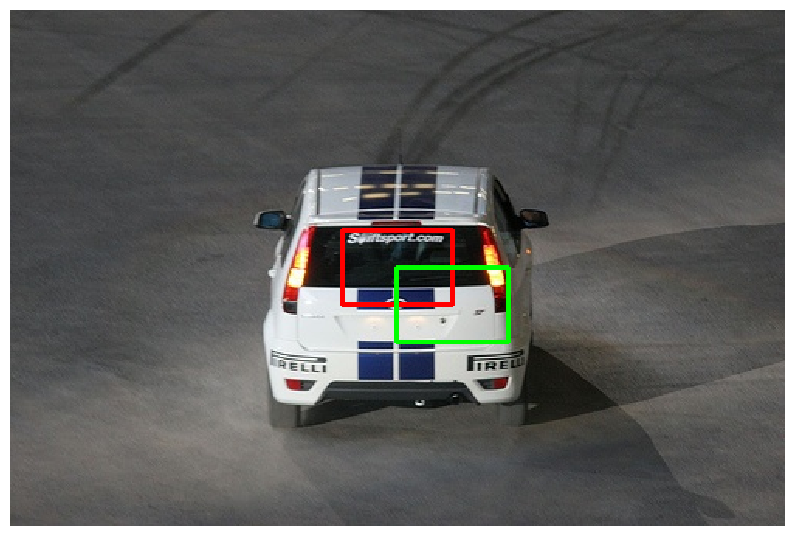

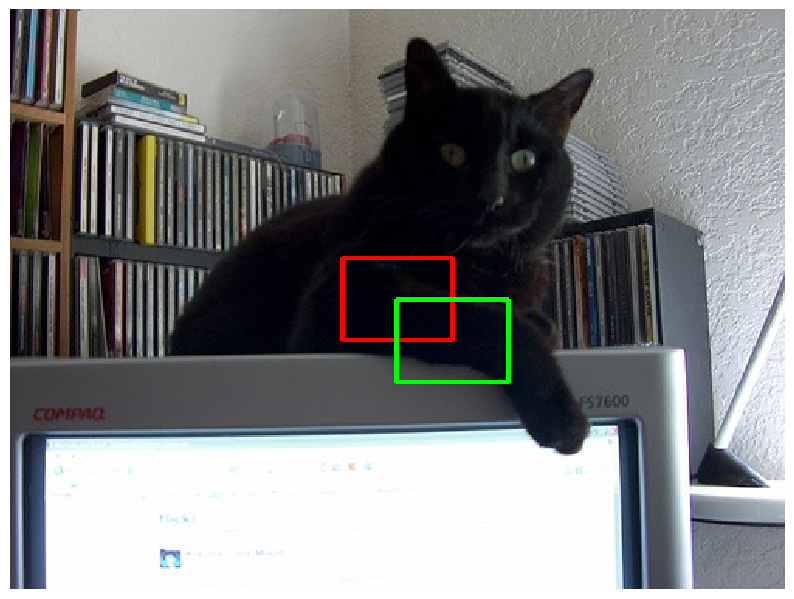

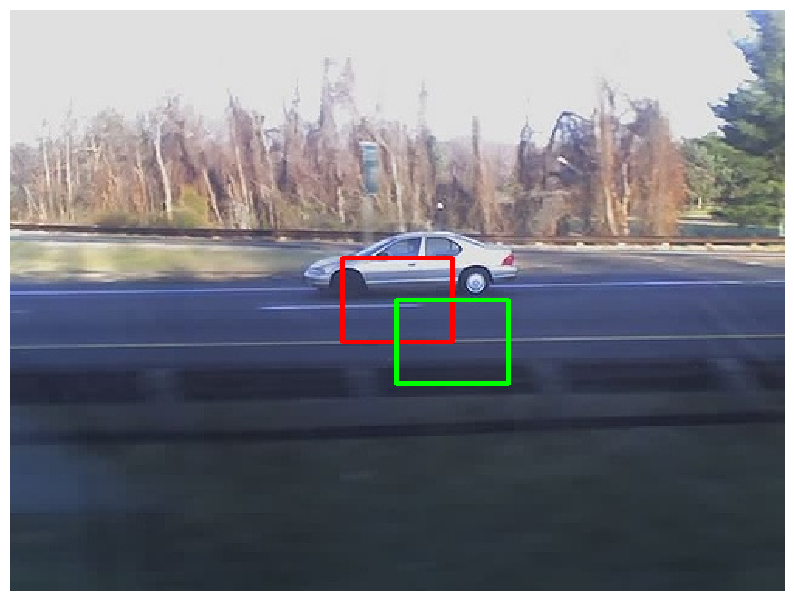

CPU times: user 669 ms, sys: 288 ms, total: 957 ms
Wall time: 646 ms


In [ ]:
%%time
yolo_offset_list = torch.cat([torch.ones_like(anc_list[:, :, :, :, 0:2]).fill_(.5), torch.zeros_like(anc_list[:, :, :, :, 2:4])], dim=-1)
yolo_proposal_list = generateProposal(anc_list, yolo_offset_list, 'YOLO')

for img, anc, prop in zip(img_list, coord_trans(anc_list[:, 0:1, 3:4, 3:4, :], w_list, h_list), \
                          coord_trans(yolo_proposal_list[:, 0:1, 3:4, 3:4, :], w_list, h_list)):
  detection_visualizer(img, idx_to_class, anc.reshape(-1, 4), prop.reshape(-1, 4))

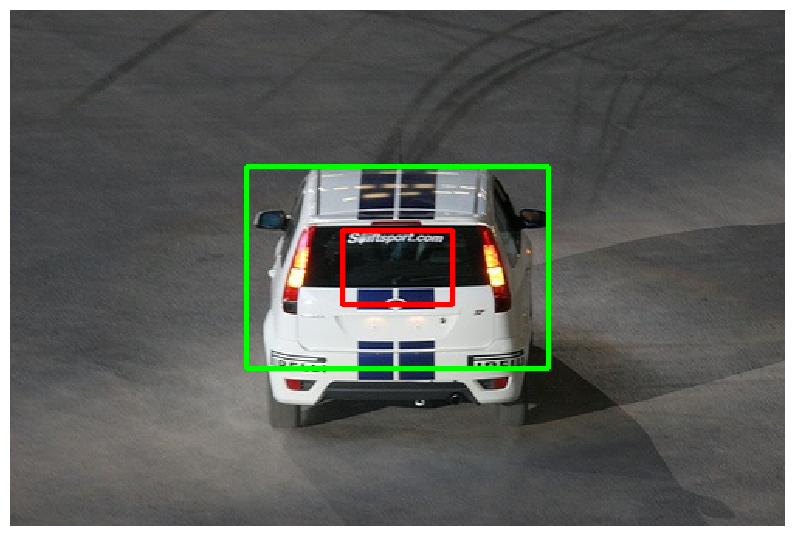

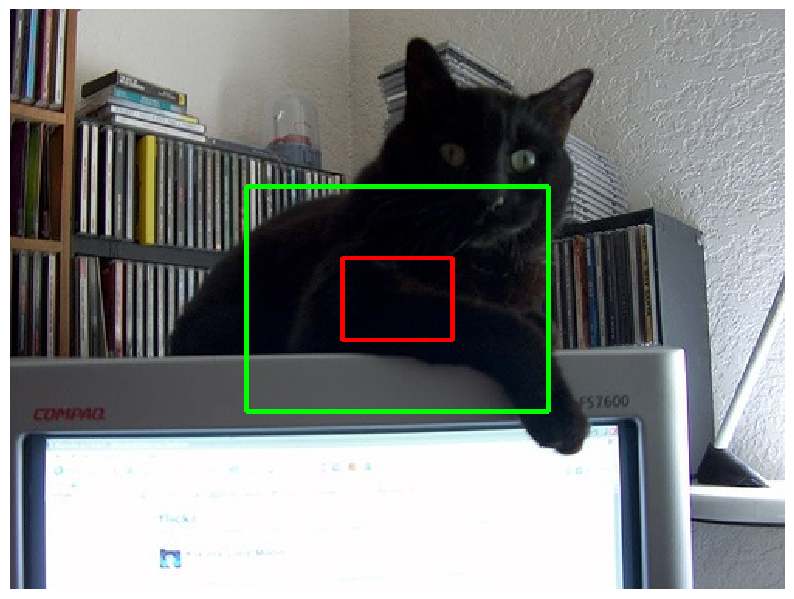

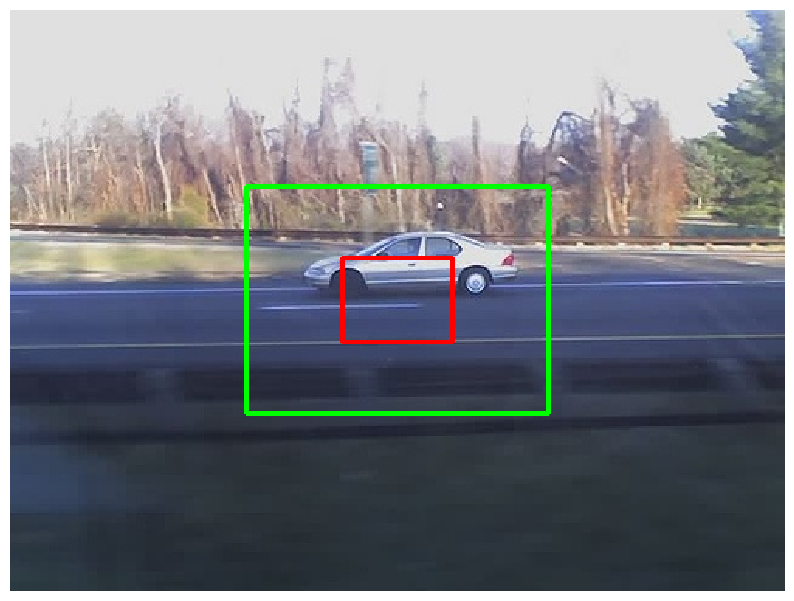

CPU times: user 663 ms, sys: 315 ms, total: 978 ms
Wall time: 658 ms


In [ ]:
%%time
yolo_offset_list = torch.cat([torch.zeros_like(anc_list[:, :, :, :, 0:2]), torch.ones_like(anc_list[:, :, :, :, 2:4]).fill_(1.)], dim=-1)
yolo_proposal_list = generateProposal(anc_list, yolo_offset_list, 'YOLO')

for img, anc, prop in zip(img_list, coord_trans(anc_list[:, 0:1, 3:4, 3:4, :], w_list, h_list), \
                          coord_trans(yolo_proposal_list[:, 0:1, 3:4, 3:4, :], w_list, h_list)):
  detection_visualizer(img, idx_to_class, anc.reshape(-1, 4), prop.reshape(-1, 4))

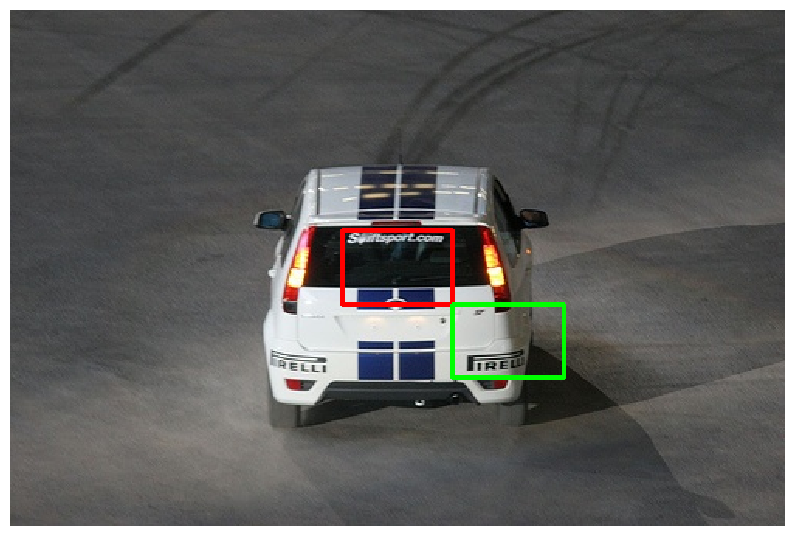

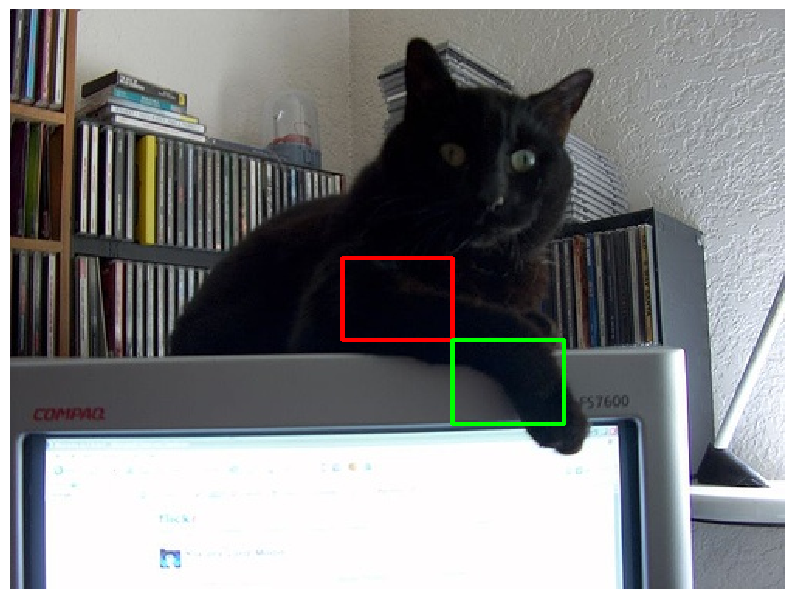

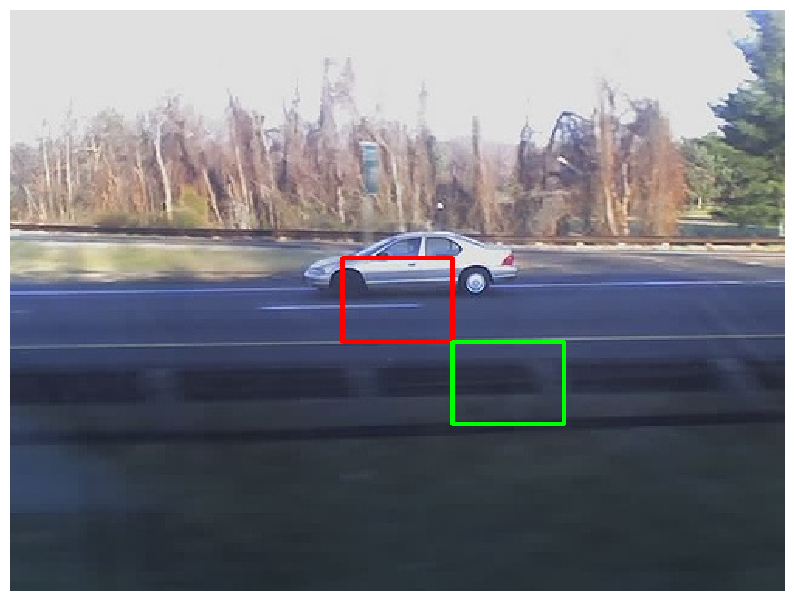

CPU times: user 682 ms, sys: 288 ms, total: 970 ms
Wall time: 695 ms


In [ ]:
%%time
# visualization (shift by wh, Faster R-CNN)
# anchors in red and proposals in green
rcnn_offset_list = torch.cat([torch.ones_like(anc_list[:, :, :, :, 0:2]), torch.zeros_like(anc_list[:, :, :, :, 2:4])], dim=-1)
rcnn_proposal_list = generateProposal(anc_list, rcnn_offset_list, 'FasterRCNN')

for img, anc, prop in zip(img_list, coord_trans(anc_list[:, 0:1, 3:4, 3:4, :], w_list, h_list), \
                          coord_trans(rcnn_proposal_list[:, 0:1, 3:4, 3:4, :], w_list, h_list)):
  detection_visualizer(img, idx_to_class, anc.reshape(-1, 4), prop.reshape(-1, 4))

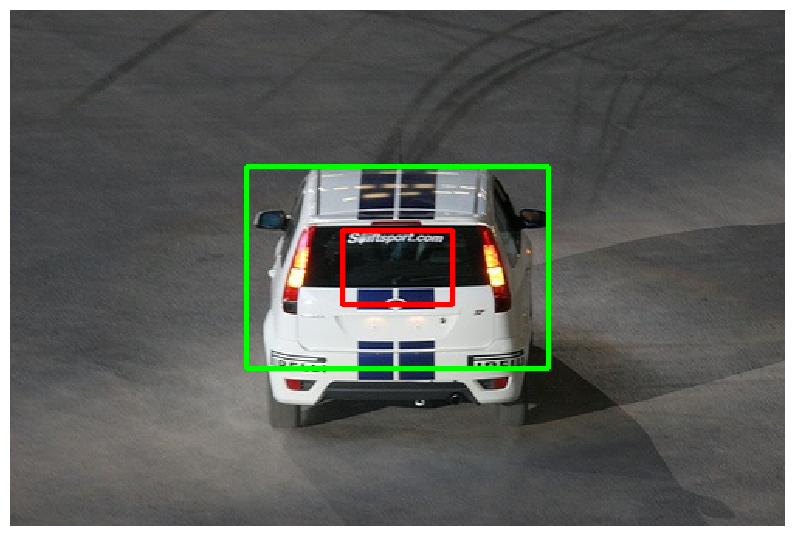

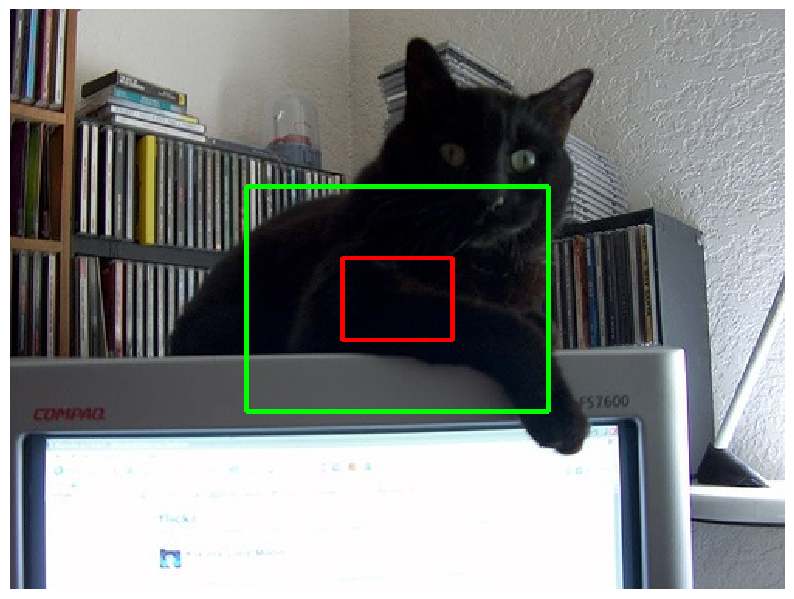

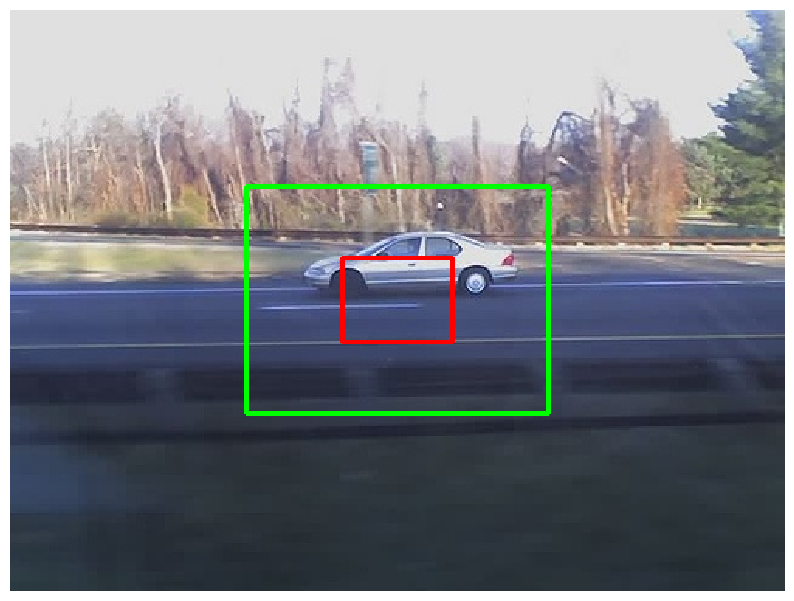

CPU times: user 685 ms, sys: 252 ms, total: 936 ms
Wall time: 689 ms


In [ ]:
%%time
# visualization (no shift and then scale by e, Faster R-CNN)
# anchors in red and proposals in green
rcnn_offset_list = torch.cat([torch.zeros_like(anc_list[:, :, :, :, 0:2]), torch.ones_like(anc_list[:, :, :, :, 2:4]).fill_(1)], dim=-1)
rcnn_proposal_list = generateProposal(anc_list, rcnn_offset_list, 'FasterRCNN')

for img, anc, prop in zip(img_list, coord_trans(anc_list[:, 0:1, 3:4, 3:4, :], w_list, h_list), \
                          coord_trans(rcnn_proposal_list[:, 0:1, 3:4, 3:4, :], w_list, h_list)):
  detection_visualizer(img, idx_to_class, anc.reshape(-1, 4), prop.reshape(-1, 4))

### Intersection Over Union

In [ ]:
def IoU(box_1, box_2):
    """
    Compute intersection over union between set of bounding boxes.
    Boxes are should be in corner representation.

    Args:
        -box_1(tensor): This tensor will be reshaped into (B, -1 , 4). So shapes    # The documentation has became spaghetti, so let me clear:
        of this tensor can be diffrent thanks to this operation. For our context    # box_1 : (B, A, H', W', 4)
        we expect to get (B, A, H', W', 4) shape.                                   # box_2 : (B, N, 5) this will be gt box in our context, I tried to write code independent from it is gtbox or not
        -box_2(tensor): For our context this tensor will be gt box of shape         # iou_mat: (B, A*H'*W', N)
        (B, N, 5), last dim: (x_tl, y_tl, x_br, y_br, class). We'll check the
        length of last dimension of this tensor to understand if it is gt_box or
        not. if length == 5 means (>4) it is gt box and we'll slice last element
        of it (class). So in the end shape will be (B, -1, 4) Gt boxes can have
        padding values "-1". These padded boxes iou will result 0 without doing
        any special operations so we will just left them alone.

    Returns:
        -iou_mat: IoU matrix of shape (B, A*H'*W', N) where iou_mat[b, i, j]
        gives the IoU between one element of box1[b, i] and box2[b, j].
    """
    B, A, H, W, _ = box_1.shape

    if box_2.shape[-1] > 4:
        # flatten interval dimensions and slice class index of box_2
        box_2 = box_2.reshape(box_2.shape[0], -1, box_2.shape[-1])[:, :, :-1]      # -> (B, N, 4)
        N = box_2.shape[1]
    elif box_2.shape[-1] == 4:
        box_2 = box_2.reshape(box_2.shape[0], -1, box_2.shape[-1])[:, :, :]      # -> (B, N, 4)
        N = box_2.shape[1]

    # flatten interval dimensions of box1
    box_1 = box_1.reshape(B, A*H*W, 4)      # (B, A, H', W', 4) -> (B, A*H'*W', 4)

    assert  torch.all(box_1[:, :, [2,3]] >= box_1[:, :, [0,1]] ), "The bottom right corner location/position of box1 should be bigger or equal to top left corner!..."
    assert  torch.all(box_2[:, :, [2,3]] >= box_2[:, :, [0,1]] ), "The bottom right corner location/position of box2 should be bigger or equal top left corner!..."

    # Dimensions arranged for BROADCASTIN and VECTORIZATION
    box_1 = box_1.unsqueeze(3) # (B, A*H'*W', 4) -> (B, A*H'*W', 4, 1)
    box_2 = box_2.unsqueeze(1).permute(0, 1, 3, 2) # (B, N, 4) -> (B, 1, 4, N)


    intersection_xtl = torch.max(box_1[:, :, 0, :], box_2[:, :, 0, :])  # (B, A*H'*W', 1, N)
    intersection_ytl = torch.max(box_1[:, :, 1, :], box_2[:, :, 1, :])
    intersection_xbr = torch.min(box_1[:, :, 2, :], box_2[:, :, 2, :])
    intersection_ybr = torch.min(box_1[:, :, 3, :], box_2[:, :, 3, :])

    intersection_area = torch.clamp((intersection_xbr - intersection_xtl), min=0.0) * torch.clamp((intersection_ybr - intersection_ytl), min=0.0) # (B, A*H'*W', 1, N)


    box_1_w_h = box_1[:, :, [2,3], :] - box_1[:, :, [0,1], :]       # (B, A*H'*W', 2, 1)
    box_1_areas = box_1_w_h[:, :, 0, :] * box_1_w_h[:, :, 1, :]     # width * height -> (B, A*H'*W', 1, 1)

    box_2_w_h = box_2[:, :, [2,3], :] - box_2[:, :, [0,1], :]       # (B, 1, 2, N)
    box_2_areas = box_2_w_h[:, :, 0, :] * box_2_w_h[:, :, 1, :]     # width * height -> (B, 1, 1, N)

    area_sums = box_1_areas + box_2_areas # (B, A*H'*W', 1, N)

    return (intersection_area / (area_sums - intersection_area)).squeeze(2)  # iou_mat of shape (B, A*H'*W', N)


In [ ]:
a = torch.Tensor([0 ,0 ,0 ,0])
a.max

<function Tensor.max>

In [ ]:
def IoU_iMelon(proposals, bboxes):
  """
  Compute intersection over union between sets of bounding boxes.

  Inputs:
  - proposals: Proposals of shape (B, A, H', W', 4)
  - bboxes: Ground-truth boxes from the DataLoader of shape (B, N, 5).
    Each ground-truth box is represented as tuple (x_lr, y_lr, x_rb, y_rb, class).
    If image i has fewer than N boxes, then bboxes[i] will be padded with extra
    rows of -1.

  Outputs:
  - iou_mat: IoU matrix of shape (B, A*H'*W', N) where iou_mat[b, i, n] gives
    the IoU between one element of proposals[b] and bboxes[b, n].

  For this implementation you DO NOT need to filter invalid proposals or boxes;
  in particular you don't need any special handling for bboxxes that are padded
  with -1.
  """
  iou_mat = None
  ##############################################################################
  # TODO: Compute the Intersection over Union (IoU) on proposals and GT boxes. #
  # No need to filter invalid proposals/bboxes (i.e., allow region area <= 0). #
  # However, you need to make sure to compute the IoU correctly (it should be  #
  # 0 in those cases.                                                          #
  # You need to ensure your implementation is efficient (no for loops).        #
  # HINT:                                                                      #
  # IoU = Area of Intersection / Area of Union, where                          #
  # Area of Union = Area of Proposal + Area of BBox - Area of Intersection     #
  # and the Area of Intersection can be computed using the top-left corner and #
  # bottom-right corner of proposal and bbox. Think about their relationships. #
  ##############################################################################
  # Replace "pass" statement with your code
  B, A, H, W,_ = proposals.shape
  _,N,_=bboxes.shape
  proposals = proposals.reshape(B,A*H*W,4)
  proposals = proposals.unsqueeze(2).repeat(1,1,N,1)
  iou_mat = torch.zeros((B,A*H*W,N),device=proposals.device)*-1

  max_x1 = torch.max(proposals[:,:,:,0],bboxes[:,:,0].unsqueeze(1))
  max_y1 = torch.max(proposals[:,:,:,1],bboxes[:,:,1].unsqueeze(1))
  min_x2 = torch.min(proposals[:,:,:,2],bboxes[:,:,2].unsqueeze(1))
  min_y2 = torch.min(proposals[:,:,:,3],bboxes[:,:,3].unsqueeze(1))
  intersection_area = torch.clamp(min_x2-max_x1,min=0) * torch.clamp(min_y2-max_y1,min=0)
  # print(intersection_area)
  # print(intersection_area.shape)
  Area1=(bboxes[:,:,2]-bboxes[:,:,0])*(bboxes[:,:,3]-bboxes[:,:,1])
  Area2=(proposals[:,:,:,2]-proposals[:,:,:,0])*(proposals[:,:,:,3]-proposals[:,:,:,1])
  # print(Area1.shape)
  # print(Area2.shape)
  iou_mat = intersection_area/(Area1.unsqueeze(1)+Area2-intersection_area)
  ##############################################################################
  #                               END OF YOUR CODE                             #
  ##############################################################################
  return iou_mat

In [ ]:
%%time
# simple sanity check
width = torch.tensor([35, 35], dtype=torch.float32, device='cpu')
heigh = torch.tensor([40, 40], dtype=torch.float32, device='cpu')
sample_bbox = torch.tensor([[[1,1,11,11,0], [20,20,30,30,0]]], dtype=torch.float32, device='cpu')
sample_proposals = torch.tensor([[[[[5,5,15,15], [27,27,37,37]]]]], dtype=torch.float32, device='cpu')


result = IoU(sample_proposals, sample_bbox)

# check 1
expected_result = torch.tensor([[[0.21951219, 0.00000000],
                                 [0.00000000, 0.04712042]]], dtype=torch.float32, device='cpu')
print('simple iou_mat error: ', rel_error(expected_result, result))

#check 2
iou_mat = IoU(anc_list, gt_boxes_amap)
expected_iou_mat = torch.tensor([0.11666405, 0.15146968, 0.02956639], dtype=torch.float32, device='cpu')
print('iou_mat error: ', rel_error(expected_iou_mat, iou_mat[:, :, 0].mean(1)))

simple iou_mat error:  0.0
iou_mat error:  4.918859477825683e-08
CPU times: user 6.57 ms, sys: 765 µs, total: 7.33 ms
Wall time: 27.5 ms


### Positive Negative Anchors (Responsibility)

In [ ]:
torch.Tensor(2,5,4).size()

torch.Size([2, 5, 4])

In [ ]:
import torch
a_mask = torch.Tensor([False, False, True]).to(torch.bool).unsqueeze(0)
b = torch.Tensor(5,3)
b * a_mask.repeat(5,1)

tensor([[ 0.0000e+00,  0.0000e+00, -1.2762e+25],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  7.2148e+22],
        [ 0.0000e+00,  0.0000e+00,  1.0313e-08]])

In [ ]:
torch.Tensor([[False, False],
              [True, False],
              [False, True]]).max(dim=0)

torch.return_types.max(
values=tensor([1., 1.]),
indices=tensor([1, 2]))

In [ ]:
bb = torch.tensor([1, 2, 3])
bb.shape

torch.Size([3])

In [ ]:
bb.squeeze(-1).shape

torch.Size([3])

### TODO: docstring yazılacak, kod özelleştirilecek

In [ ]:
import torch
asd = torch.randn(2, 8, 2)
asd

tensor([[[-2.1152, -0.3561],
         [ 0.4372,  0.4913],
         [-0.2041, -0.0885],
         [ 0.5239, -0.6659],
         [-0.2473, -1.0438],
         [-1.3453,  0.7854],
         [ 0.9928, -0.1932],
         [-0.3090,  0.5026]],

        [[ 1.8530,  0.4681],
         [-0.1577,  1.4437],
         [ 0.2660,  0.1665],
         [ 0.8744, -0.1435],
         [-0.8437,  0.9318],
         [ 1.2590,  2.0050],
         [ 0.0537,  0.6181],
         [-0.4128, -0.8411]]])

In [ ]:
asd.dtype

torch.float32

In [ ]:
asd.is_contiguous()

True

In [ ]:
asd.stride()  # en soldaki dim'de (0) adım atman için 16 byte,
              #row'da (1) adım atman için 2 byte,
              #kolon'da (2) adım atman için 1 byte gerekli

(16, 2, 1)

In [ ]:
asd.storage().data_ptr()

<ipython-input-79-03e51af0e104>:1: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  asd.storage().data_ptr()


99123284112128

In [ ]:
asd[0, 0].data_ptr()

99123284112128

In [ ]:
asd[0, 1].data_ptr()  # anlamadığım şekilde 1 byte' ı(8 bit) 4 bit olarak yorumladı, altta da 3 byte'ı(24 bit) 12 bit olarak

99123284112136

In [ ]:
asd[1, 0].data_ptr()

99123284112192

In [ ]:
import torch
a = torch.ones(2,4)

In [ ]:
mask_a = torch.tensor([[0, 1, 0, 0],
                       [0, 0, 0, 1]]).to(torch.bool)
mask_a

tensor([[False,  True, False, False],
        [False, False, False,  True]])

In [ ]:
b = a[mask_a]
b

tensor([1., 1.])

In [ ]:
b[:] = torch.tensor([55, 55])
b

tensor([55., 55.])

In [ ]:
a

tensor([[1., 1., 1., 1.],
        [1., 1., 1., 1.]])

In [ ]:
def ReferenceOnActivatedAnchors(anchors, bboxes, grid, iou_mat, pos_thresh=0.7, neg_thresh=0.3, method='FasterRCNN'):
  """
    Inputs:
  - anchors: Anchor boxes, of shape BxAxH’xW’x4
  - bboxes: GT boxes of shape BxNx5, where N is the number of PADDED GT boxes,
            5 indicates (x_{lr}^{gt}, y_{lr}^{gt}, x_{rb}^{gt}, y_{rb}^{gt}) and class index
  - grid (float): A cell grid of shape BxH'xW'x2 where 2 indicate the (x, y) coord
  - iou_mat: IoU matrix of shape Bx(AxH’xW’)xN
  - pos_thresh: Positive threshold value
  - neg_thresh: Negative threshold value
  - method: Switch between 'YOLO' mode and 'FasterRCNN' mode

  Outputs:
  - activated_anc_ind: Index on activated anchors, of shape M, where M indicates the
    number of activated anchors
                                                                                                    # M: total number of positive anchor indexes. For each image for every gt box you need to have one positive box, so for example for 2. image 3 gt_boxes, there should be 3 positive for this image.
  - negative_anc_ind: Index on negative anchors, of shape M                                         # do not forget that this M dim vector contains all of image's positive anchor indices. So question is, how can we distinguish which index is related to image.
  - GT_conf_scores: GT IoU confidence scores on activated anchors, of shape M                       #
  - GT_offsets: GT offsets on activated anchors, of shape Mx4. They are denoted as
                \hat{t^x}, \hat{t^y}, \hat{t^w}, \hat{t^h} in the formulation earlier.
  - GT_class: GT class category on activated anchors, essentially indexed from bboxes[:, :, 4],
              of shape M
  - activated_anc_coord: Coordinates on activated anchors (mainly for visualization purposes)
  - negative_anc_coord: Coordinates on negative anchors (mainly for visualization purposes)

  """
  #print("input shapes", "-"*35)
  #print("anchors: ", anchors.shape)
  #print("bboxes: ", bboxes.shape)
  #print("grid: ", grid.shape)
  #print("iou_mat: ", iou_mat.shape)
  #print("-"*35, "\n")




  assert(method in ['FasterRCNN', 'YOLO'])

  B, A, h_amap, w_amap, _ = anchors.shape
  N = bboxes.shape[1]
  print(bboxes.shape)

  # activated/positive anchors
  max_iou_per_anc, max_iou_per_anc_ind = iou_mat.max(dim=-1)
  if method == 'FasterRCNN':
    max_iou_per_box = iou_mat.max(dim=1, keepdim=True)[0]
    activated_anc_mask = (iou_mat == max_iou_per_box) & (max_iou_per_box > 0)
    activated_anc_mask |= (iou_mat > pos_thresh) # using the pos_thresh condition as well
    # if an anchor matches multiple GT boxes, choose the box with the largest iou
    activated_anc_mask = activated_anc_mask.max(dim=-1)[0] # Bx(AxH’xW’)
    activated_anc_ind = torch.nonzero(activated_anc_mask.view(-1)).squeeze(-1)

    # GT conf scores
    GT_conf_scores = max_iou_per_anc[activated_anc_mask] # M

    # GT class
    box_cls = bboxes[:, :, 4].view(B, 1, N).expand((B, A*h_amap*w_amap, N))
    GT_class = torch.gather(box_cls, -1, max_iou_per_anc_ind.unsqueeze(-1)).squeeze(-1) # M
    GT_class = GT_class[activated_anc_mask].long()

    bboxes_expand = bboxes[:, :, :4].view(B, 1, N, 4).expand((B, A*h_amap*w_amap, N, 4))
    bboxes = torch.gather(bboxes_expand, -2, max_iou_per_anc_ind.unsqueeze(-1) \
      .unsqueeze(-1).expand(B, A*h_amap*w_amap, 1, 4)).view(-1, 4)
    bboxes = bboxes[activated_anc_ind]

  else:  # YOLO
    bbox_mask = (bboxes[:, :, 0] != -1) # BxN, indicate invalid boxes,
    bbox_centers = (bboxes[:, :, 2:4] - bboxes[:, :, :2]) / 2. + bboxes[:, :, :2] # BxNx2  # gt box centers  # calculated directly from linear algebra, vector addition-substraction

    # grid.view(B, -1, 2).unsqueeze(2) -> (B, H'*W', 1, 2)
    # bbox_centers.unsqueeze(1) ->        (B,  1,    N, 2)
    # manhattan distance op result ->     (B, H'*W', N)

    mah_dist = torch.abs(grid.view(B, -1, 2).unsqueeze(2) - bbox_centers.unsqueeze(1)).sum(dim=-1) # Bx(H'xW')xN
    min_mah_dist = mah_dist.min(dim=1, keepdim=True)[0] # Bx1xN
    grid_mask = (mah_dist == min_mah_dist).unsqueeze(1) # Bx1x(H'xW')xN

    # iou_mat shape: (B, A*H'*W', N)
    reshaped_iou_mat = iou_mat.view(B, A, -1, N)  # (B, A, H'*W', N)
    anc_with_largest_iou = reshaped_iou_mat.max(dim=1, keepdim=True)[0] # Bx1x(H’xW’)xN
    anc_mask = (anc_with_largest_iou == reshaped_iou_mat) # BxAx(H’xW’)xN

    # (B, 1, H'*W', N) & (B, A, H'*W', N) # for every gt box, we found the most near grid (manhat.), and for this grid we will find most valued (iou) anchor
    activated_anc_mask = (grid_mask & anc_mask).view(B, -1, N) # (B, A*H'*W', N)
    # bbox_mask : (B, N) : indicates is it padding or not
    activated_anc_mask &= bbox_mask.unsqueeze(1) # bbox_mask.unsqueeze(1): (B, 1, N),  activated_anc_mask.shape : (B, A*H'*W', N)

    # activated_anc_mask.view(-1): (B*A*H'*W'*N)
    activated_anc_ind = torch.nonzero(activated_anc_mask.view(-1)).squeeze(-1) # after nonzero op and squeeze: activated_anc_ind:(M) tensor will be returned (read comment above if not clear)
                                                                               # activated_anc_mask.view(-1) : (B*A*H'*W'*N)
                                                                               # activated_anc_ind: (M)
                                                                               # example: activated_anc_ind[x]: x index value : for spesific image (b), spesific grid (h,w),
                                                                               # spesific gt (n), spesific anchor (a) : YOU CAN THINK THESE AS "STRIDE".
                                                                               # after flatten some dimensions of tensor. You can still use flatten dimesion indices to access element on this flatten tensor.
                                                                               # this process will be done by STRIDE values (length/size) of these flatten dimensions (thanks to tensor's c-style contiguos memory approach)
    GT_conf_scores = iou_mat.view(-1)[activated_anc_ind] # array/fancy indexing via M shape tensor (activeted_anc_ind)

    # bboxes:(B, N, 5)-> .view(): (B, 1, N, 5) -> .repeat(): (B, A*H'*W', N, 5) -> view(-1, 5): (B*A*H'*W'*N, 5) -> array/fancy indexing [activated_anc_ind]: (M, 5) (if not clear what M is look above comments)
    bboxes = bboxes.view(B, 1, N, 5).repeat(1, A*h_amap*w_amap, 1, 1).view(-1, 5)[activated_anc_ind]  # (M, 5)
    GT_class = bboxes[:, 4].long() # (M) casted long
    bboxes = bboxes[:, :4] # (M, 4)
    activated_anc_ind = (activated_anc_ind / float(activated_anc_mask.shape[-1])).long() # ( / != // ) division, we divide indices by N, so stride N is not required anymore, stride B,H,W,A still necessary
                                                                                         # flatten tensor'ü N'e bölerek (-1, N) şeklinde yorumlayabileceğimiz bir posizyona sokuyor
  print('number of pos proposals (M) : ', activated_anc_ind.shape[0])  # prints M
  activated_anc_coord = anchors.reshape(-1, 4)[activated_anc_ind]

  # GT offsets
  # bbox and anchor coordinates are x_tl, y_tl, x_br, y_br
  # offsets are t_x, t_y, t_w, t_h
  wh_offsets = torch.log((bboxes[:, 2:4] - bboxes[:, :2]) \
    / (activated_anc_coord[:, 2:4] - activated_anc_coord[:, :2]))       # (M, 2)

  xy_offsets = (bboxes[:, :2] + bboxes[:, 2:4] - \
    activated_anc_coord[:, :2] - activated_anc_coord[:, 2:4]) / 2.      # (M, 2)

  if method == "FasterRCNN":
    xy_offsets /= (activated_anc_coord[:, 2:4] - activated_anc_coord[:, :2])
  else:
    assert torch.max(torch.abs(xy_offsets)) <= 0.5, \
      "x and y offsets should be between -0.5 and 0.5! Got {}".format( \
      torch.max(torch.abs(xy_offsets)))

  GT_offsets = torch.cat((xy_offsets, wh_offsets), dim=-1) # (M, 4)

  # negative anchors
  negative_anc_mask = (max_iou_per_anc < neg_thresh) # (B, A*H’*W’)
  negative_anc_ind = torch.nonzero(negative_anc_mask.view(-1)).squeeze(-1)
  print("There are {} number of negative boxes, {}:(M) number of will be sampled randomly ".format(negative_anc_ind.shape[0], activated_anc_ind.shape[0]))
  negative_anc_ind = negative_anc_ind[torch.randint(0, negative_anc_ind.shape[0], (activated_anc_ind.shape[0],))]
  negative_anc_coord = anchors.reshape(-1, 4)[negative_anc_ind.view(-1)]

  #print("\noutput shapes", "-"*35)
  #print("activated_anc_ind: ", activated_anc_ind.shape)
  #print("negative_anc_ind: ", negative_anc_ind.shape)
  #print("GT_conf_scores: ", GT_conf_scores.shape)
  #print("GT_offsets: ", GT_offsets.shape)
  #print("GT_class: ", GT_class.shape)
  #print("activated_anc_coord: ", activated_anc_coord.shape)
  #print("negative_anc_coord: ", negative_anc_coord.shape)
  #print("-"*35, "\n")




  # activated_anc_coord and negative_anc_coord are mainly for visualization purposes
  return activated_anc_ind, negative_anc_ind, GT_conf_scores, GT_offsets, GT_class, \
         activated_anc_coord, negative_anc_coord

In [ ]:
# sanity check on YOLO (the one on Faster R-CNN is in A5-2)
activated_anc_ind, negative_anc_ind, GT_conf_scores, GT_offsets, GT_class, \
  activated_anc_coord, negative_anc_coord = ReferenceOnActivatedAnchors(anc_list, gt_boxes_amap, grid_cell_centers, iou_mat, neg_thresh=0.2, method='YOLO')

expected_GT_conf_scores = torch.tensor([0.74538743, 0.72793430, 0.76044953, 0.37116671], device='cpu', dtype=torch.float32)
expected_GT_offsets = torch.tensor([[ 0.04900002,  0.35735703, -0.09431065,  0.19244696],
                                    [-0.14700007,  0.37299442, -0.00250307,  0.25213102],
                                    [-0.40600014,  0.09625626,  0.20863886, -0.07974572],
                                    [ 0.15399981, -0.42933345, -0.03459148, -0.86750042]], device='cpu', dtype=torch.float32)
expected_GT_class = torch.tensor([ 6,  7, 19,  6], device='cpu', dtype=torch.int64)
print('conf scores error: ', rel_error(GT_conf_scores, expected_GT_conf_scores))
print('offsets error: ', rel_error(GT_offsets, expected_GT_offsets))
print('class prob error: ', rel_error(GT_class, expected_GT_class))

torch.Size([3, 40, 5])
number of pos proposals (M) :  4
There are 997 number of negative boxes, 4:(M) number of will be sampled randomly 
conf scores error:  9.797600387389281e-08
offsets error:  2.74833962496982e-07
class prob error:  0.0


In [ ]:
anc_per_img = torch.prod(torch.tensor(anc_list.shape[1:-1]))
anc_per_img   # number of anchor boxes per image

tensor(441)

In [ ]:
activated_anc_ind  # M dim, positive anchor indexes (each value refers spesific anchor on spesific image)

tensor([122, 605, 871, 955])

In [ ]:
# every image indexes are inside of
# [image_num * number of anchor boxes per image, (image_number + 1) * number of anchor boxes per image] range  !!!!!
# with this information we can spesify which index in activated_anc_ind related with which image and which anchor !!!!!
idx = 0 # let's look at how many activated/positive boxes are there in first (0 idx) image through activated_anc_ind
(activated_anc_ind >= idx * anc_per_img) & (activated_anc_ind < (idx+1) * anc_per_img)

tensor([ True, False, False, False])

********************************************************************************
Activated (positive) anchors:
1 activated anchors!


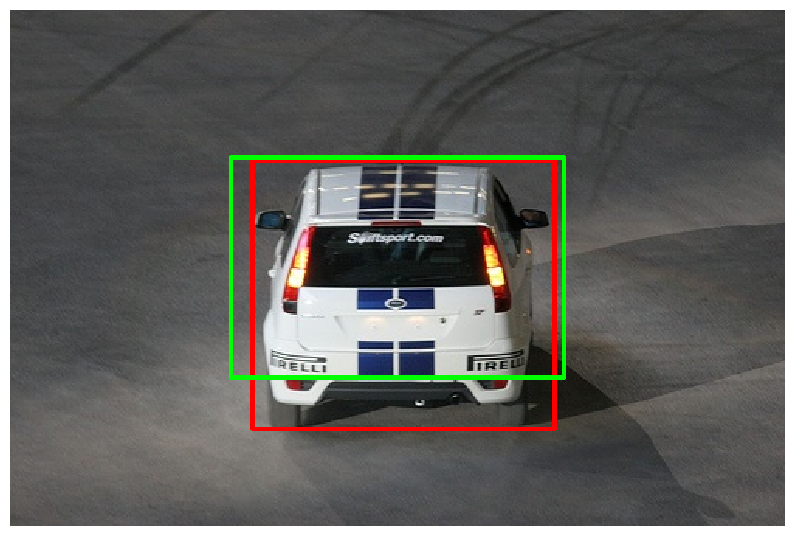

2 activated anchors!


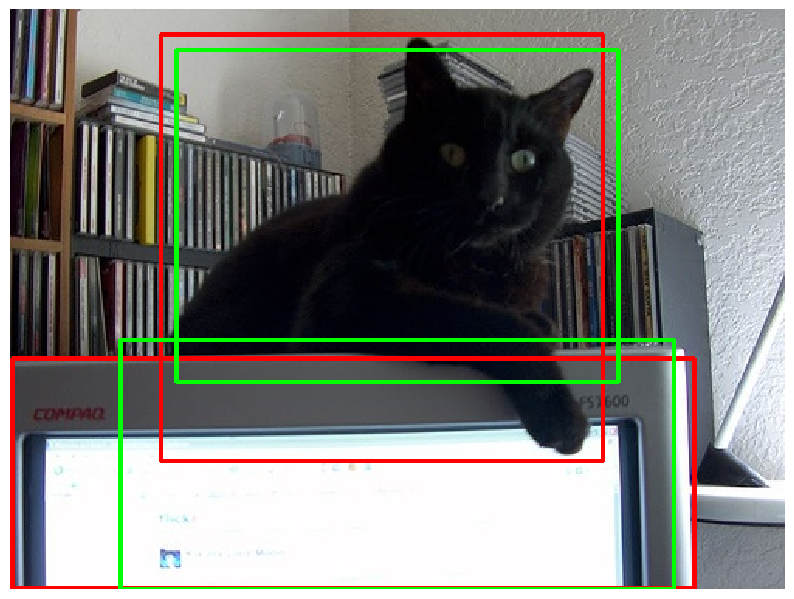

1 activated anchors!


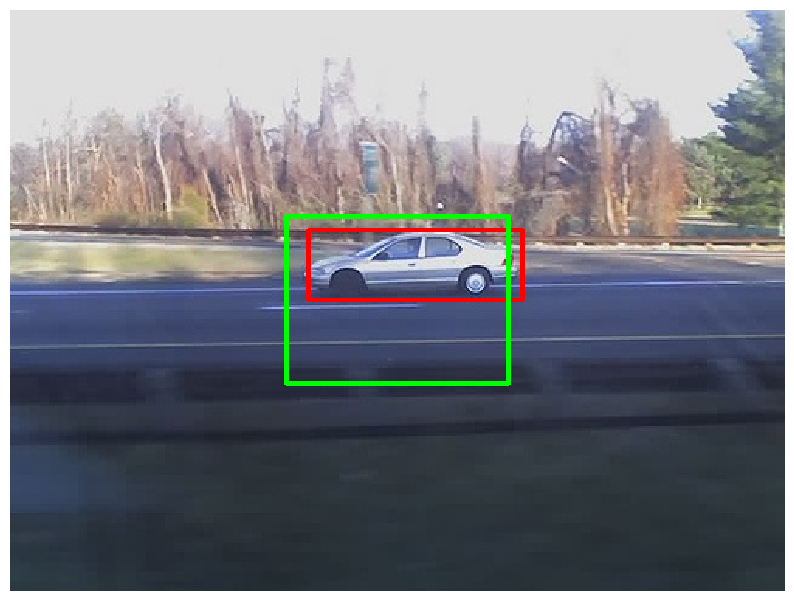

********************************************************************************
Negative anchors:
2 negative anchors!


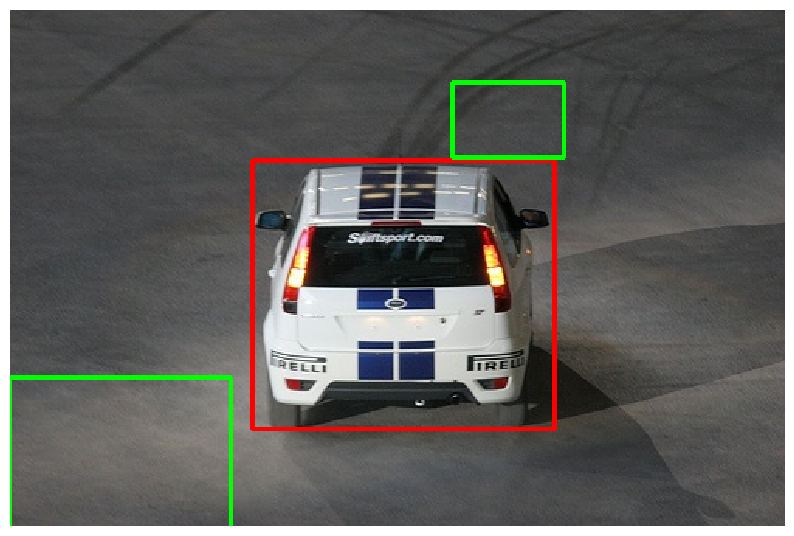

0 negative anchors!


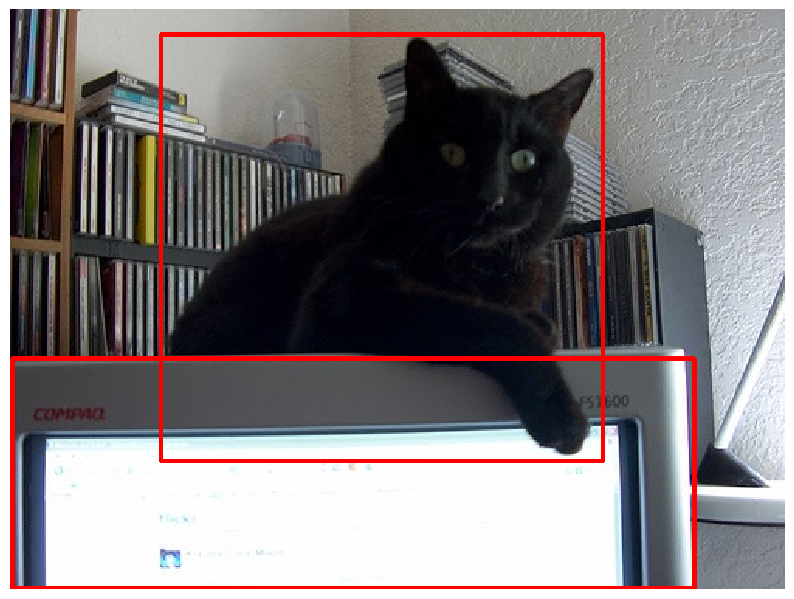

2 negative anchors!


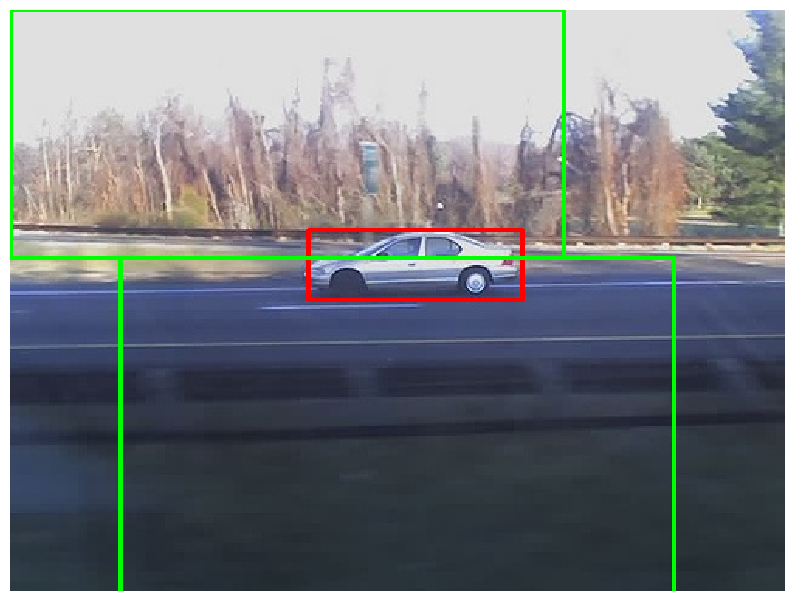

In [ ]:
# visualize activated and negative anchors
anc_per_img = torch.prod(torch.tensor(anc_list.shape[1:-1]))

print('*'*80)
print('Activated (positive) anchors:')
for img, bbox, idx in zip(img_list, box_list, torch.arange(box_list.shape[0])):
  anc_ind_in_img = (activated_anc_ind >= idx * anc_per_img) & (activated_anc_ind < (idx+1) * anc_per_img)
  print('{} activated anchors!'.format(torch.sum(anc_ind_in_img)))
  detection_visualizer(img, idx_to_class, bbox[:, :4], coord_trans(activated_anc_coord[anc_ind_in_img], w_list[idx], h_list[idx]))

print('*'*80)
print('Negative anchors:')
for img, bbox, idx in zip(img_list, box_list, torch.arange(box_list.shape[0])):
  anc_ind_in_img = (negative_anc_ind >= idx * anc_per_img) & (negative_anc_ind < (idx+1) * anc_per_img)
  print('{} negative anchors!'.format(torch.sum(anc_ind_in_img)))
  detection_visualizer(img, idx_to_class, bbox[:, :4], coord_trans(negative_anc_coord[anc_ind_in_img], w_list[idx], h_list[idx]))


### Prediction Network

In [ ]:
class PredictionNetwork(nn.Module):
    """
    The module recieves feature tensor from feature extractor, and outputs prediction tensor,
    which contains transformation-offsets,  confidence scores and class probabilities for
    every anchors.
    """
    def __init__(self, in_dim, hidden_dim=128, num_anchors=9, num_classes=20, drop_ratio=0.3):
        super(PredictionNetwork, self).__init__()
        """
        Constructure of module. Creates related submodules. The depth of output tensor
        will be (C_out: num_classes + (num_anchors * 5 ))

        Args:
            -in_dim(int): specify the depth of input tensor (C_in)
            (for our context it should be 1280 if ı am not mistaken)
            -hidden_dim(int): specify the depth of interval tensor
            -num_anchors(int): specify how many anchors will this module produce
            -num_classes(int): specify number of classes
            -drop_ratio(int): ratio for Dropout Layer

        """
        assert(num_classes != 0 and num_anchors != 0)
        self.num_classes = num_classes
        self.num_anchors = num_anchors

        self.model = torch.nn.Sequential(
            torch.nn.Conv2d(in_dim, hidden_dim, 1, stride=1),
            torch.nn.Dropout(drop_ratio),
            torch.nn.LeakyReLU(),
            torch.nn.Conv2d(hidden_dim, int(num_classes + (num_anchors * 5)), 1, stride=1)  # Cout: (num_classes + (A * 5))
        )

    def _extract_anchor_data(self, anchor_data, anchor_idx):
        """
        Extracts-slices D dimensional informations (confidence score and offsets):( 1 + 4 )
        from self.model output tensor by specified anchor_idx (anchor indexes)

        Args:
            -anchor_data(tensor): Tensor of shape (B, A, D, H, W): (B, A, 5, H, W).
            For every grid H,W results D:(gt score + offsets):(1 + 4):(5)
            -anchor_idx(tensor): int64 Tensor of shape (M,) gives anchor indices
            to extract

        Returns:
            -extracted_anchors(tensor): Tensor of shape (M, D) giving anchor
            data (gt score + offsets) for each of the anchors specified
            by anchor_idx.

        """
        B, A, D, H, W = anchor_data.shape
        anchor_data = anchor_data.permute(0, 1, 3, 4, 2).contiguous().view(-1, D) # flatten all dimensions except D
        extracted_anchors = anchor_data[anchor_idx]  # (M, D)
        return extracted_anchors


    def _extract_class_scores(self, all_scores, anchor_idx):
        """
        Extracts C class informations (in our context it will be 20) from every
        grid H,W. (all_scores tensor came from the slice (slice of C) of output tensor
        from self.model)

        Args:
            -all_scores: Tensor of shape(B, C, H, W) gives classification scores
            for C classes at each point in H, W grid
            -anchor_idx: int64 tensor of shape (M,) giving the indices of anchors
            at which to extract classification scores
        Returns:
            -extracted_scores: Tensor of shape (M, C) giving the classification
            sores for each of the anchors specified by anchor_idx
        """

        B, C, H, W = all_scores.shape
        A = self.num_anchors
        all_scores = all_scores.contiguous().permute(0, 2, 3, 1).contiguous()
        all_scores = all_scores.view(B, 1, H, W, C).expand(B, A, H, W, C)  # to able to use anchor_idx we need to have A dim
        all_scores = all_scores.reshape((B * A * H * W), C)
        extracted_scores = all_scores[anchor_idx] # (M, C)

        return extracted_scores

    def forward(self, features, pos_anchor_idx=None, neg_anchor_idx=None):
        """
        Run the forward pass of the network to predict outputs given features
        from the backbone network.

        Inputs:
        - features: Tensor of shape (B, in_dim, 7, 7) giving image features computed
          by the backbone network.
        - pos_anchor_idx: int64 Tensor of shape (M,) giving the indices of anchors
          marked as positive. These are only given during training; at test-time
          this should be None.
        - neg_anchor_idx: int64 Tensor of shape (M,) giving the indices of anchors
          marked as negative. These are only given at training; at test-time this
          should be None.

        The outputs from this method are different during training and inference.

        During training, pos_anchor_idx and neg_anchor_idx are given and identify
        which anchors should be positive and negative, and this forward pass needs
        to extract only the predictions for the positive and negative anchors.

        During inference, only features are provided and this method needs to return
        predictions for all anchors.

        Outputs (During training):
        - conf_scores: Tensor of shape (2*M, 1) giving the predicted classification
          scores for positive anchors and negative anchors (in that order).
        - offsets: Tensor of shape (M, 4) giving predicted transformation for
          positive anchors.
        - class_scores: Tensor of shape (M, C) giving classification scores for
          positive anchors.

        Outputs (During inference):
        - conf_scores: Tensor of shape (B, A, H, W) giving predicted classification
          scores for all anchors.
        - offsets: Tensor of shape (B, A, 4, H, W) giving predicted transformations
          all all anchors.
        - class_scores: Tensor of shape (B, C, H, W) giving classification scores for
          each spatial position.
    """

        conf_scores, offsets, class_scores = None, None, None

        out = self.model(features)
        B, Cout, H, W = out.shape

        # inference/test mode: result tensor of self.model will be plainly sliced
        if pos_anchor_idx is None:
            conf_scores = out[:, 0:(self.num_anchors*5):5, :, :]    # C scores are placed at the end of this tensor
            conf_scores = torch.sigmoid(conf_scores)     # functional api

            offsets = out[:, :self.number_anchors*5, :, :].reshape(B, -1, 5, H, W)[:, :, 1:, :, :]  # (B, A, 4, H, W)
            offsets[:, :, :2, :, :] = torch.sigmoid(offsets[:, : , :2, :, :]) -0.5  # center transformations should be between 0.5 -0.5

            class_scores = out[:, self.num_anchors*5:, :, :]

        # train mode: result tensor of self.model will be sliced by specific anchors (positive-negative)
        # this specification handled by methods written previously (_extract_anchor_data (conf + offset),
        # _extract_class_scores (class scores in "logits"))
        else:
            # (M, D)
            pos_anchors = self._extract_anchor_data(out[:, :self.num_anchors*5, :, :].reshape(B, self.num_anchors, -1, H, W), pos_anchor_idx)
            neg_anchors = self._extract_anchor_data(out[:, :self.num_anchors*5, :, :].reshape(B, self.num_anchors, -1, H, W), neg_anchor_idx)

            # (2M, 1): positive-negative box conf scores respectively
            conf_scores = torch.stack([pos_anchors[:, 0], neg_anchors[:, 0]], dim=0).reshape(-1, 1)
            conf_scores = torch.sigmoid(conf_scores)

            # (M, 4)
            offsets = pos_anchors[:, 1:].clone()
            offsets[:,:2] = torch.sigmoid(offsets[:, :2]) - 0.5     # center transformations should be between 0.5 -0.5

            # (M, C)
            class_scores = self._extract_class_scores(out[:, self.num_anchors*5:], pos_anchor_idx)

        return conf_scores, offsets, class_scores



In [ ]:

# sanity check
reset_seed(0)
pred_network = PredictionNetwork(1280, drop_ratio=0).to(dtype=torch.float32, device='cpu')
features = torch.linspace(-10., 10., steps=3*1280*7*7, dtype=torch.float32, device='cpu').view(3, 1280, 7, 7)
pos_anchor_idx = torch.tensor([122, 605, 871, 955], dtype=torch.int64, device='cpu')
neg_anchor_idx = torch.tensor([1048, 1292, 1124, 1092], dtype=torch.int64, device='cpu')
conf_scores, offsets, class_prob = pred_network(features, pos_anchor_idx, neg_anchor_idx)

expected_conf_scores = torch.tensor([[0.85080749], [0.55230302], [0.45239496], [0.51819414],
                                     [0.38467780], [0.82627463], [0.53837817], [0.538446366]], dtype=torch.float32, device='cpu')
expected_offsets = torch.tensor([[-0.16344640,  0.45598251, -1.56108809, -1.96177566],
                                 [ 0.09087485, -0.11321104,  0.46109992,  0.13557276],
                                 [ 0.14098871, -0.04003078, -0.14689390,  0.01480492],
                                 [-0.22611487,  0.14513946, -1.26124716,  0.58137202]], dtype=torch.float32, device='cpu')
expected_class_prob = torch.tensor([0.88649291, 1.08752346, 0.90241265, 1.28021181, 0.77324629,
                                    -0.93609941, 1.44269419, -1.01072836, 0.09888625, -0.09179375,
                                    -0.48814785, -1.14749694, 0.24533349, -0.19522685, 0.21445289,
                                    0.91779679, 0.97305167, 1.01984429, -0.11932681, 0.34998628], dtype=torch.float32, device='cpu')

print('conf scores error: ', rel_error(conf_scores, expected_conf_scores))
print('offsets error: ', rel_error(offsets, expected_offsets))
print('class prob error: ', rel_error(class_prob.mean(0), expected_class_prob))

conf scores error:  1.9265553659435872e-07
offsets error:  4.253621320511217e-07
class prob error:  3.0986117062740853e-07


### Losses (ConfScoreRegressionLoss, BoxTransformationLoss, ObjectClassificationLoss Loss)

Loss methods written as normal python functions.

In [ ]:
def ConfScoreRegressionLoss(conf_scores, GT_conf_scores):
  """
  Use sum-squared error as in YOLO (not mean squared err)

  Inputs:
  - conf_scores: Predicted confidence scores
  - GT_conf_scores: GT confidence scores

  Outputs:
  - conf_score_loss
  """


  GT_conf_scores = torch.cat((GT_conf_scores, torch.zeros_like(GT_conf_scores)), dim=0).view(-1, 1)

                                                                # commented expression below is going to avarage over both batch dimension and all boxes per image
  conf_score_loss = torch.sum((conf_scores - GT_conf_scores)**2) # * 1. / GT_conf_scores.shape[0]
  return conf_score_loss

In [ ]:
def BboxRegressionLoss(offsets, GT_offsets):
  """"
  Use sum-squared error as in YOLO
  For both xy and wh

  Inputs:
  - offsets: Predicted box offsets
  - GT_offsets: GT box offsets

  Outputs:
  - bbox_reg_loss
  """                                                   # commented expression below is going to avarage over both batch dimension and all boxes per image
  bbox_reg_loss = torch.sum((offsets - GT_offsets)**2) # * 1. / GT_offsets.shape[0]
  return bbox_reg_loss

In [ ]:
def ObjectClassificationLoss(class_prob, GT_class, batch_size, anc_per_img, activated_anc_ind):
  """"
  Use softmax loss

  Inputs:
  - class_prob: Predicted class logits
  - GT_class: GT box class label

  Outputs:
  - object_cls_loss
  """
  # average within sample and then average across batch
  # such that the class pred would not bias towards dense popular objects like `person` !!!!!!!!!!!!!
  all_loss = torch.nn.functional.cross_entropy(class_prob, GT_class, reduction='none') # returns all loss per gt box in all image (not avaraged yet!)


  object_cls_loss = 0
  for idx in range(batch_size):
    anc_ind_in_img = (activated_anc_ind >= idx * anc_per_img) & (activated_anc_ind < (idx+1) * anc_per_img)
    object_cls_loss += all_loss[anc_ind_in_img].sum() * 1. / torch.sum(anc_ind_in_img) # average over image (e.g. img5 has 25 gt, then all
                                                                                       # classification losses of 25 gt will be avareged by 25)

  object_cls_loss /= batch_size                                                        # avareging over batch-all images

  return object_cls_loss

In [ ]:
# sanity check

conf_loss = ConfScoreRegressionLoss(conf_scores, GT_conf_scores)
reg_loss = BboxRegressionLoss(offsets, GT_offsets)
cls_loss = ObjectClassificationLoss(class_prob, GT_class, w_list.shape[0], anc_per_img, activated_anc_ind)
print('conf loss: {:.4f}, reg loss: {:.4f}, cls loss: {:.4f}'.format(conf_loss, reg_loss, cls_loss))

loss_all = torch.tensor([conf_loss.data, reg_loss.data, cls_loss.data], device='cpu', dtype=torch.float32)
expected_loss = torch.tensor([0.27064770460128784, 2.9750006198883057, 2.3919472694396973], device='cpu', dtype=torch.float32)

print('loss error: ', rel_error(loss_all, expected_loss))

conf loss: 1.5690, reg loss: 11.9000, cls loss: 2.3919
loss error:  0.6


# Training

### Model Building

In [ ]:
class SingleStageDetector(nn.Module):
  def __init__(self):
    super().__init__()

    self.anchor_list = torch.tensor([[1., 1], [2, 2], [3, 3], [4, 4], [5, 5], [2, 3], [3, 2], [3, 5], [5, 3]]) # READ ONLY
    self.feat_extractor = FeatureExtractor()
    self.num_classes = 20
    self.pred_network = PredictionNetwork(1280, num_anchors=self.anchor_list.shape[0], \
                                          num_classes=self.num_classes)
  def forward(self, images, bboxes):
    """
    Training-time forward pass for the single-stage detector.

    Inputs:
    - images: Input images, of shape (B, 3, 224, 224)
    - bboxes: GT bounding boxes of shape (B, N, 5) (padded)

    Outputs:
    - total_loss: Torch scalar giving the total loss for the batch.
    """
    # weights to multiple to each loss term (Focal loss in some way)
    w_conf = 1 # for conf_scores
    w_reg = 1 # for offsets
    w_cls = 1 # for class_prob

    total_loss = None


    out = self.feat_extractor(images)
    grid = generateGridCenters(images.shape[0])
    print(self.anchor_list.shape, grid.shape)
    anchors = generateAnchor(self.anchor_list, grid)
    iou_mat =  IoU(anchors, bboxes)
    activated_anc_ind, negative_anc_ind, GT_conf_scores, GT_offsets, GT_class, activated_anc_coord, negative_anc_coord = ReferenceOnActivatedAnchors(anchors, bboxes, grid, iou_mat,neg_thresh=0.2)
    conf_scores, offsets, class_scores =  self.pred_network(out,activated_anc_ind, negative_anc_ind)

    conf_loss = ConfScoreRegressionLoss(conf_scores, GT_conf_scores)
    reg_loss = BboxRegressionLoss(offsets, GT_offsets)
    anc_per_img =  anchors.shape[1]* anchors.shape[2]* anchors.shape[3] # A*H*W
    cls_loss = ObjectClassificationLoss(class_scores, GT_class, images.shape[0], anc_per_img, activated_anc_ind)
    total_loss = w_conf * conf_loss + w_reg * reg_loss + w_cls * cls_loss

    return total_loss


  def inference(self, images, thresh=0.5, nms_thresh=0.7):
    """"
    Inference-time forward pass for the single stage detector.

    Inputs:
    - images: Input images
    - thresh: Threshold value on confidence scores
    - nms_thresh: Threshold value on NMS

    Outputs:
    - final_propsals: Keeped proposals after confidence score thresholding and NMS,
                      a list of B (*x4) tensors (B, *, 4)
    - final_conf_scores: Corresponding confidence scores, a list of B (*x1) tensors (B, *, 1)
    - final_class: Corresponding class predictions, a list of B  (*x1) tensors (B, *, 1)
    """
    final_proposals, final_conf_scores, final_class = [], [], []


    out = self.feat_extractor(images)
    B = images.shape[0]
    grid = generateGridCenters(B, 7, 7)
    anchors = generateAnchor(self.anchor_list, grid)

    #         offsets:(B, A, 4, H, W)
    conf_scores, offsets, class_scores =  self.pred_network(out)

    offsets = offsets.permute(0,1,3,4,2)  # (B, A, H, W, 4)
    #offsets = offsets.permute(0, 1, 3, 4, 2).contiguous().view()

    offsets = generateProposal(anchors, offsets, method='YOLO').double() # (B, A, H, W, 4)


    #offsets = offsets.permute(0,1,4,2,3).double() # (B, A, 4, H', W', dtype=torch.double)

    #   - conf_scores: Tensor of shape (B, A, H, W) giving predicted classification
    #      scores for all anchors.
    #   - offsets: Tensor of shape (B, A, 4, H, W) giving predicted transformations
    #      all all anchors.
    #   - class_scores: Tensor of shape (B, C, H, W) giving classification scores for

    conf_scores = conf_scores.reshape(conf_scores.shape[0], conf_scores.shape[1], -1)       # (B, A, H*W)
    offsets = offsets.reshape(offsets.shape[0], offsets.shape[1], offsets.shape[4], -1)     # (B, A, 4, H*W)
    class_scores =  class_scores.reshape(class_scores.shape[0], class_scores.shape[1], -1)  # (B, C, H*W)
    #offsets = offsets.permute(0,1,3,2)  # (B, A, H*W, 4)


    conf_scores = conf_scores.permute(0,2,1)    # (B, H*W, A)
    offsets = offsets.permute(0,3,1,2)          # (B, H*W, A, 4)
    class_scores =class_scores.permute(0,2,1)   # (B, H*W, C)
    print(conf_scores.shape)
    print(offsets.shape)
    print(class_scores.shape)

    for b in range(B):
      local_conf_scores = conf_scores[b] # (H*W, A)
      local_offsets =  offsets[b] # (H*W, A, 4)
      local_class_scores, idx_class_scores = class_scores[b].max(dim = 1) # (H*W,), # (H*W,)

      target = torch.zeros(local_offsets.shape[0],local_offsets.shape[1],local_offsets.shape[2]+2) # (H*W, A, 4+2) (every_grid, every_anc, offsets+conf+class)
      target[:,:,:4] = local_offsets
      target[:,:,4] = local_conf_scores

      target[:,:,5] = idx_class_scores.unsqueeze(1).repeat(1, local_offsets.shape[1]) # (H*W,) -> (H*W, 1) -> (H*W, A)
      target = target.reshape(-1,6) # (H*W*A, 6): (H*W*A, offset+conf+class)
      target = target[target[:,4]>thresh] # confidence score tresholding, eliminating proposals before nnms (nnms is another and final eliminating process)
      idx = torchvision.ops.nms(target[:,:4], target[:,4].reshape(-1), nms_thresh)
      target = target[idx]
      final_proposals.append(target[:,:4].detach())
      final_conf_scores.append(target[:,4].reshape(-1,1).detach())
      final_class.append(target[:,5].reshape(-1,1).detach())

    return final_proposals, final_conf_scores, final_class

In [ ]:
import torch.optim as optim
import time

### DetectionSolver Building (all training process handled by this object)

In [ ]:
def DetectionSolver(detector, train_loader, learning_rate=3e-3,
                    lr_decay=1, num_epochs=20, dtype=torch.float32,
                    device='cpu', **kwargs):
  """
  Solver object for SingleDetector.
  Run optimization to train the model.
  """

  # give device and dtype
  detector.to(dtype=dtype, device=device)

  # optimizer setup
  optimizer = optim.SGD(
    filter(lambda p: p.requires_grad, detector.parameters()),  #lambda p: p.requires_grad=True, detector.parameters()
    learning_rate) # leave betas and eps by default
  lr_scheduler = optim.lr_scheduler.LambdaLR(optimizer,
                                             lambda epoch: lr_decay ** epoch)

  # sample minibatch data
  loss_history = []
  epoch_loss_history = []
  detector.train()  # train mode
  for i in range(num_epochs):
    start_t = time.time()
    epoch_loss = 0.0

    for iter_num, data_batch in enumerate(train_loader):
      images, boxes, w_batch, h_batch, _ = data_batch
      resized_boxes = coord_trans(boxes, w_batch, h_batch, mode='i2a')
      images = images.to(dtype=dtype, device=device)
      resized_boxes = resized_boxes.to(dtype=dtype, device=device)

      loss = detector(images, resized_boxes)
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()

      loss_history.append(loss.item())
      epoch_loss += loss.item() * images.shape[0]

      print('(Iter {} / {})'.format(iter_num, len(train_loader)))

    end_t = time.time()
    epoch_loss = epoch_loss / len(train_loader.dataset)
    epoch_loss_history.append(epoch_loss)
    print('(Epoch {} / {}) loss: {:.4f} time per epoch: {:.1f}s'.format(
        i, num_epochs, loss.item(), end_t-start_t))

    lr_scheduler.step()

  # plot the training losses
  plt.subplot(1, 2, 1)
  plt.plot(loss_history)
  plt.xlabel('Iteration')
  plt.ylabel('Loss')
  plt.title('Training loss history')
  plt.subplot(1, 2, 2)
  plt.plot(epoch_loss_history)
  plt.xlabel('Epoch')
  plt.ylabel('Loss')
  plt.show()

Evaluate trained model by running one epoch on dataloader and prints-returns loss

In [ ]:
def DetectionEvaluater(detector, loader, dtype=torch.float32, device='cpu', **kwargs):
  """
  Evaluate trained model.
  Runs trained model one epoch and print and returns loss.
  """
  # ship model to GPU
  detector.to(dtype=dtype, device=device)

  # sample minibatch data
  detector.eval()
  with torch.no_grad():
    start_t = time.time()
    epoch_loss = 0.0
    for iter_num, data_batch in enumerate(loader):
      images, boxes, w_batch, h_batch, _ = data_batch
      resized_boxes = coord_trans(boxes, w_batch, h_batch, mode='i2a')
      images = images.to(dtype=dtype, device=device)
      resized_boxes = resized_boxes.to(dtype=dtype, device=device)

      epoch_loss += detector(images, resized_boxes) * images.shape[0]

    end_t = time.time()

  # divide by number of instances
  epoch_loss = epoch_loss / len(loader.dataset)
  print(f'Epoch loss: {epoch_loss:.4f}')
  return epoch_loss

### Fit model on small Subset

lr:  0.01
torch.Size([9, 2]) torch.Size([10, 7, 7, 2])
****** torch.Size([10, 9, 7, 7, 4])
torch.Size([10, 17, 5])
number of pos proposals (M) :  47
There are 3319 number of negative boxes, 47:(M) number of will be sampled randomly 
(Iter 0 / 1)
(Epoch 0 / 50) loss: 52.9623 time per epoch: 2.8s
torch.Size([9, 2]) torch.Size([10, 7, 7, 2])
****** torch.Size([10, 9, 7, 7, 4])
torch.Size([10, 17, 5])
number of pos proposals (M) :  47
There are 3319 number of negative boxes, 47:(M) number of will be sampled randomly 
(Iter 0 / 1)
(Epoch 1 / 50) loss: 266.5441 time per epoch: 1.9s
torch.Size([9, 2]) torch.Size([10, 7, 7, 2])
****** torch.Size([10, 9, 7, 7, 4])
torch.Size([10, 17, 5])
number of pos proposals (M) :  47
There are 3319 number of negative boxes, 47:(M) number of will be sampled randomly 
(Iter 0 / 1)
(Epoch 2 / 50) loss: 57.2216 time per epoch: 1.9s
torch.Size([9, 2]) torch.Size([10, 7, 7, 2])
****** torch.Size([10, 9, 7, 7, 4])
torch.Size([10, 17, 5])
number of pos proposals (M

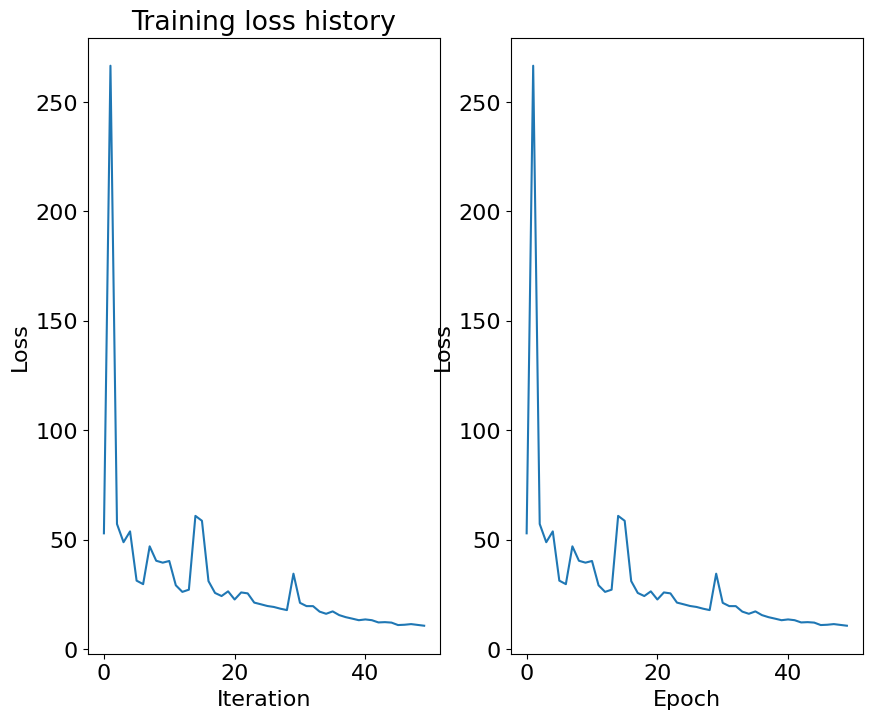

In [ ]:
reset_seed(0)
num_sample = 10
small_dataset = torch.utils.data.Subset(train_dataset, torch.linspace(0, len(train_dataset)-1, steps=num_sample).long())
small_train_loader = get_pascal_voc2007_loader(small_dataset, 10) # a new loader, batch size is also 10 (can be interpretted as full batch now not minibatch)

for lr in [1e-2]:
  print('lr: ', lr)
  detector = SingleStageDetector()
  DetectionSolver(detector, small_train_loader, learning_rate=lr, num_epochs=50, dtype=torch.float32, device='cpu')

### Train a net

torch.Size([9, 2]) torch.Size([100, 7, 7, 2])
****** torch.Size([100, 9, 7, 7, 4])
torch.Size([100, 15, 5])
number of pos proposals (M) :  352
There are 30095 number of negative boxes, 352:(M) number of will be sampled randomly 
(Iter 0 / 25)
torch.Size([9, 2]) torch.Size([100, 7, 7, 2])
****** torch.Size([100, 9, 7, 7, 4])
torch.Size([100, 37, 5])
number of pos proposals (M) :  413
There are 30862 number of negative boxes, 413:(M) number of will be sampled randomly 
(Iter 1 / 25)
torch.Size([9, 2]) torch.Size([100, 7, 7, 2])
****** torch.Size([100, 9, 7, 7, 4])
torch.Size([100, 11, 5])
number of pos proposals (M) :  369
There are 30738 number of negative boxes, 369:(M) number of will be sampled randomly 
(Iter 2 / 25)
torch.Size([9, 2]) torch.Size([100, 7, 7, 2])
****** torch.Size([100, 9, 7, 7, 4])
torch.Size([100, 12, 5])
number of pos proposals (M) :  357
There are 31760 number of negative boxes, 357:(M) number of will be sampled randomly 
(Iter 3 / 25)
torch.Size([9, 2]) torch.Siz

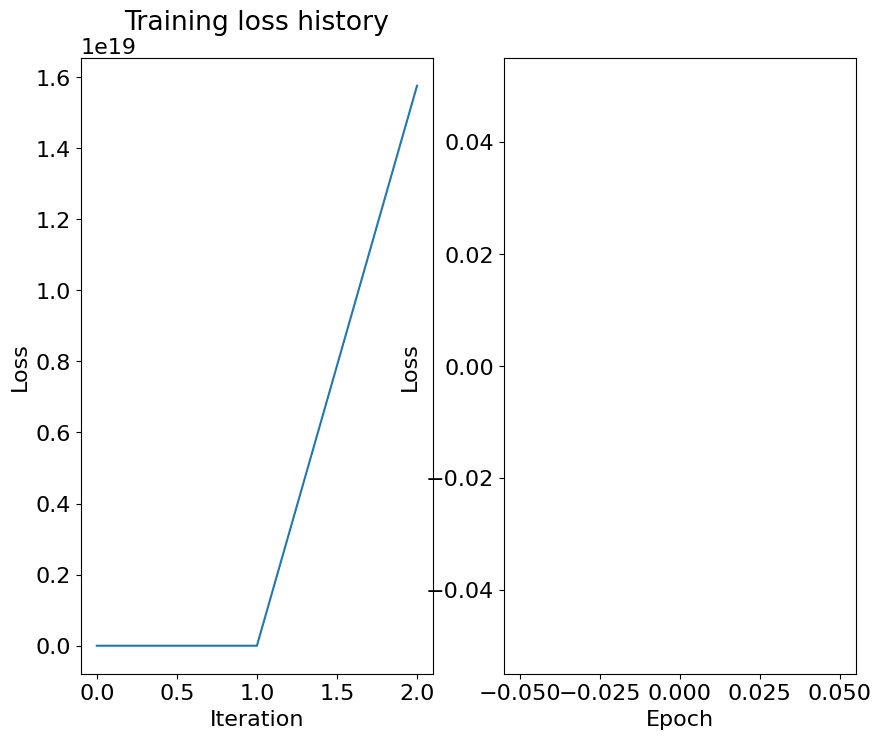

In [ ]:
# monitor the training loss
train_loader = get_pascal_voc2007_loader(train_dataset, 100)

lr = 5e-2
num_epochs = 1
yolo_detector = SingleStageDetector().to(dtype=torch.float32, device='cpu')
DetectionSolver(yolo_detector, train_loader, learning_rate=lr, num_epochs=num_epochs, dtype=torch.float32, device='cpu')

### Save and load weight of trained model

In [ ]:
weights_path = os.path.join("./weights_dir", "yolo_detector.pt")
torch.save(yolo_detector.state_dict(), weights_path)

yolo_detector = SingleStageDetector().to(dtype=torch.float32, device='cpu')
yolo_detector.load_state_dict(torch.load(weights_path))
DetectionEvaluater(yolo_detector, train_loader, dtype=torch.float32, device='cpu')

RuntimeError: ignored

### Non max suppression

In [ ]:
def nms(boxes, scores, iou_threshold=0.5, topk=None):
  """
  Non-maximum suppression removes overlapping bounding boxes.

  Inputs:
  - boxes: top-left and bottom-right coordinate values of the bounding boxes
    to perform NMS on, of shape Nx4
  - scores: scores for each one of the boxes, of shape N
  - iou_threshold: discards all overlapping boxes with IoU > iou_threshold; float
  - topk: If this is not None, then return only the topk highest-scoring boxes.
    Otherwise if this is None, then return all boxes that pass NMS.

  Outputs:
  - keep: torch.long tensor with the indices of the elements that have been
    kept by NMS, sorted in decreasing order of scores; of shape [num_kept_boxes]
  """

  if (not boxes.numel()) or (not scores.numel()):
    return torch.zeros(0, dtype=torch.long)

  keep = None
 # 0- box'ların kendi arasında iou matrisini oluştur
 # 1- score'ları sırala, aynı sıralamayı box'lara da uygula
 # 2- score maski oluştur (full true)
 # 3- tüm score'u gezene kadar score'dan sırayla eleman al, eleman true değilse 3. aşamayı tekrarla (loop)
 # 4- alınan score ile ilintili box'ın diğer boxlar ile iousuna (row) condition uygula, iou'lar < iou_threshold ve mask oluştur
 #    oluşan mask ile score mask'i and/& uygula yeni score maski/listesi oluştur döngü için
 # 5- döngü bitiminden sonra nihai mask üzerinde nonzero uygulayarak true'ların index'lerini al
 # 6- en sonda topk kadar olan elemanı alarak return et.

  boxes_temp = boxes.reshape(1, boxes.shape[0], boxes.shape[-1])  # (1, N, 4)
  iou_mat = IoU(boxes_temp, boxes_temp).unsqueeze(0) # (N, N)

  _, sorted_score_indices = torch.sort(scores, descending=True)
  sorted_boxes = boxes[sorted_score_indices]
  score_mask = torch.ones_like(sorted_score_indices)

  for i in sorted_score_indices:
    if score_mask[i] == False:
        continue
    score_mask &= iou_mat[i] < iou_threshold

  if topk != None:
    return score_mask.nonzero()[:topk]
  return score_mask.nonzero()





"""    DENENECEK HIZ TESPITI YAPILACAK
  _, indices = torch.sort(scores,descending=True)
  boxes = boxes[indices]
  idx = []
  while len(boxes) != 0:
    local_box = boxes[0]
    local_index = indices[0]
    idx.append(local_index)
    boxes = boxes[1:]
    indices = indices[1:]
    to_del_idx = []
    for i in range(boxes.shape[0]):
      IoU_var = IoU(local_box.reshape(1,1,1,1,-1),boxes[i].reshape(1,1,-1)).item()
      if IoU_var > iou_threshold:
        to_del_idx.append(i)
    for counter,del_idx in enumerate(to_del_idx):
      boxes = torch.cat([boxes[0:del_idx-counter], boxes[(del_idx+1-counter):]])
      indices = torch.cat([indices[0:del_idx-counter], indices[(del_idx+1-counter):]])d
  keep = torch.Tensor(idx)

  return keep
"""

In [ ]:
# sanity check and benchmark of nms of mine and torch.ops.nms()
reset_seed(0)
boxes = (100. * torch.rand(5000, 4)).round()
boxes[:,2] = boxes[:,2] + boxes[:,0] + 1.
boxes[:,3] = boxes[:,3] + boxes[:,1] + 1.
scores = torch.randn(5000)

names = ['your_cpu', 'torchvision_cpu', 'torchvision_cuda']
iou_thresholds = [0.3, 0.5, 0.7]
elapsed = dict(zip(names, [0.]*len(names)))
intersects = dict(zip(names[1:], [0.]*(len(names)-1)))

for iou_threshold in iou_thresholds:
  tic = time.time()
  my_keep = nms(boxes, scores, iou_threshold)  #
  elapsed['your_cpu'] += time.time() - tic

  tic = time.time()
  tv_keep = torchvision.ops.nms(boxes, scores, iou_threshold)  # torchvision implementation of nms on cpu
  elapsed['torchvision_cpu'] += time.time() - tic
  intersect = len(set(tv_keep.tolist()).intersection(my_keep.tolist())) / len(tv_keep)
  intersects['torchvision_cpu'] += intersect

  tic = time.time()
  tv_cuda_keep = torchvision.ops.nms(boxes.cuda(), scores.cuda(), iou_threshold).to(my_keep.device) # torchvision implementation of nms on cuda
  torch.cuda.synchronize()
  elapsed['torchvision_cuda'] += time.time() - tic
  intersect = len(set(tv_cuda_keep.tolist()).intersection(my_keep.tolist())) / len(tv_cuda_keep)
  intersects['torchvision_cuda'] += intersect

for key in intersects:
  intersects[key] /= len(iou_thresholds)

# You should see < 1% difference
print('Testing NMS:')
print('Your        CPU  implementation: %fs' % elapsed['your_cpu'])
print('torchvision CPU  implementation: %fs' % elapsed['torchvision_cpu'])
print('torchvision CUDA implementation: %fs' % elapsed['torchvision_cuda'])
print('Speedup CPU : %fx' % (elapsed['your_cpu'] / elapsed['torchvision_cpu']))
print('Speedup CUDA: %fx' % (elapsed['your_cpu'] / elapsed['torchvision_cuda']))
print('Difference CPU : ', 1. - intersects['torchvision_cpu']) # in the order of 1e-3 or less
print('Difference CUDA: ', 1. - intersects['torchvision_cuda']) # in the order of 1e-3 or less

### Inference

In [ ]:
import shutil

In [ ]:
def DetectionInference(detector, data_loader, dataset, idx_to_class, thresh=0.8, nms_thresh=0.3, output_dir=None, dtype=torch.float32, device='cpu'):

  # change device and dtype of model
  detector.to(dtype=dtype, device=device)

  detector.eval()
  start_t = time.time()

  det_dir = 'mAP/input/detection-results'    # save model detections and ground truths in spesific directory
  gt_dir = 'mAP/input/ground-truth'          # then download mAP repo clone and run mAP module on these files
                                             # in the last cell we are doing this procedure
  if output_dir is not None:
    if os.path.exists(det_dir):
      shutil.rmtree(det_dir)
    os.mkdir(det_dir)
    if os.path.exists(gt_dir):
      shutil.rmtree(gt_dir)
    os.mkdir(gt_dir)

  for iter_num, data_batch in enumerate(data_loader):
    images, boxes, w_batch, h_batch, img_name = data_batch
    images = images.to(dtype=dtype, device=device)

    final_proposals, final_conf_scores, final_class = detector.inference(images, thresh=thresh, nms_thresh=nms_thresh)

    # clamp on the proposal coordinates
    batch_size = len(images)
    for idx in range(batch_size):
      torch.clamp_(final_proposals[idx][:, 0::2], min=0, max=w_batch[idx])  # be careful of inplace operation
      torch.clamp_(final_proposals[idx][:, 1::2], min=0, max=h_batch[idx])



      # visualization
      # get the original image
      # hack to get the original image so we don't have to load from local again...
      i = batch_size*iter_num + idx
      img, _ = dataset.__getitem__(i)

      num_valid_box = sum([1 if j != -1 else 0 for j in boxes[idx][:, 0]])  # number gt boxes for this spesific image
      final_all = torch.cat((final_proposals[idx], \
        final_class[idx].float(), final_conf_scores[idx]), dim=-1).cpu()
      resized_proposals = coord_trans(final_all, w_batch[idx], h_batch[idx])  #TODO: cat'den önce coord_trans daha mantıklı burada patlaması gerekli kodun

      # write results to file for evaluation (this will be used-> mAP API from https://github.com/Cartucho/mAP )
      if output_dir is not None:
        file_name = img_name[idx].replace('.jpg', '.txt')
        # simultaneously opening 2 files with context manager
        with open(os.path.join(det_dir, file_name), 'w') as f_det, \
        open(os.path.join(gt_dir, file_name), 'w') as f_gt:
          print('{}: {} GT bboxes and {} proposals'.format(img_name[idx], num_valid_box, resized_proposals.shape[0]))
          for b in boxes[idx][:num_valid_box]:
            f_gt.write('{} {:.2f} {:.2f} {:.2f} {:.2f}\n'.format(idx_to_class[b[4].item()], b[0], b[1], b[2], b[3]))
          for b in resized_proposals:
            f_det.write('{} {:.6f} {:.2f} {:.2f} {:.2f} {:.2f}\n'.format(idx_to_class[b[4].item()], b[5], b[0], b[1], b[2], b[3]))
      else:
        detection_visualizer(img, idx_to_class, boxes[idx][:num_valid_box], resized_proposals)

  end_t = time.time()
  print('Total inference time: {:.1f}s'.format(end_t-start_t))

In [ ]:
DetectionInference(detector, small_train_loader, small_dataset, idx_to_class, thresh=0.8, device='cuda', dtype=torch.float32)

### Evaluation

In [ ]:
DetectionInference(yolo_detector, val_loader, val_dataset, idx_to_class, output_dir='mAP/input', thresh=0.8, nms_thresh=0.3, device='cuda', dtype=torch.float32)
!cd mAP && python main.py